In [1]:
import gym
import torch
import gym_nav
import numpy as np

import sys
sys.path.append('../')
from evaluation import *
from model_evaluation import *
from trajectories import *
from explore_analysis import *
from shortcut_analysis import *
from plotting_utils import *

from tqdm import tqdm
from umap import UMAP

pplt.rc.reset()

# Data collection

## Policy: 100 eps with and without shortcut, fixed starts, tracking when shortcut is seen

### wc1.5

In [57]:
chks = np.arange(40, 470, 20)

probs = [0.1, 0.2, 0.4]
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=100)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=100)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/wc1.5_policy/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [11:32<00:00, 31.48s/it]


### wc4

In [58]:
chks = np.arange(40, 470, 20)

probs = [0.1, 0.2, 0.4]
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcutnav_fcp{p}reset3batch64', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=100)

        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=100)

        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/wc4_policy/{key}', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████████████████| 22/22 [05:11<00:00, 14.17s/it]


## Compute UMAP projections for some checkpoints

Only first 50 eps from both shortcut and non-shortcut, and skip if too many pos points (agent was not successful enough in task and so activation will often look messy)

### wc4

In [185]:
chks = np.arange(40, 470, 20)
chk_idxs = [16, 18, 20, 21]
probs = [0.1, 0.2, 0.4]
first_n_eps = 50

for x, (p, t) in enumerate(itertools.product(probs, range(3))):

    key = f'{p}_{t}'
    
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_policy/{key}', 'rb'))
    shortcut_res['activ2d'] = {}
    for chk in tqdm(chk_idxs):
        res1 = shortcut_res['ns'][chk]
        res2 = shortcut_res['ws'][chk]
        activs1 = activs_list_to_dict(res1['activs'][:first_n_eps])
        activs2 = activs_list_to_dict(res2['activs'][:first_n_eps])

        pos1 = np.vstack(res1['ep_pos'][:first_n_eps])
        pos2 = np.vstack(res2['ep_pos'][:first_n_eps])
        pos = np.vstack([pos1, pos2])
        if len(pos) > 8000:
            continue

        activ1 = activs1['shared_activations'][1]
        activ2 = activs2['shared_activations'][1]
        activ = torch.vstack([activ1, activ2])

        dists = [0.15, 0.25, 0.5, 0.75]
        activ2ds = []
        for j, dist in enumerate(dists):
            activ2d = UMAP(min_dist=dist).fit_transform(activ)
            activ2ds.append(activ2d)
            
        shortcut_res['activ2d'][chk] = activ2ds
    
    pickle.dump(shortcut_res, open(f'data/shortcut/wc4_policy/{key}', 'wb'))


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [01:36<00:00, 24.01s/it]


### wc1.5

In [ ]:
chks = np.arange(40, 470, 20)
chk_idxs = [16, 18, 20, 21]
probs = [0.1, 0.2, 0.4]
first_n_eps = 50

for x, (p, t) in enumerate(itertools.product(probs, range(3))):

    key = f'{p}_{t}'
    
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_policy/{key}', 'rb'))
    shortcut_res['activ2d'] = {}
    for chk in tqdm(chk_idxs):
        res1 = shortcut_res['ns'][chk]
        res2 = shortcut_res['ws'][chk]
        activs1 = activs_list_to_dict(res1['activs'][:first_n_eps])
        activs2 = activs_list_to_dict(res2['activs'][:first_n_eps])

        pos1 = np.vstack(res1['ep_pos'][:first_n_eps])
        pos2 = np.vstack(res2['ep_pos'][:first_n_eps])
        pos = np.vstack([pos1, pos2])
        if len(pos) > 10000:
            continue

        activ1 = activs1['shared_activations'][1]
        activ2 = activs2['shared_activations'][1]
        activ = torch.vstack([activ1, activ2])

        dists = [0.15, 0.25, 0.5, 0.75]
        activ2ds = []
        for j, dist in enumerate(dists):
            activ2d = UMAP(min_dist=dist).fit_transform(activ)
            activ2ds.append(activ2d)
            
        shortcut_res['activ2d'][chk] = activ2ds
    
    pickle.dump(shortcut_res, open(f'data/shortcut/wc1.5_policy/{key}', 'wb'))


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [02:08<00:00, 32.04s/it]


In [296]:
all_activ2ds = {}
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_policy/{key}', 'rb'))
    all_activ2ds[key]['activ2d'] = shortcut_res['activ2d']
    
    all_activ2ds[key]['ns'] = []
    all_activ2ds[key]['ws'] = []
    
    for i in range(len(shortcut_res['ns'])):
        all_activ2ds[key]['ns'].append({
            'ep_pos': shortcut_res['ns'][i]['ep_pos'],
            'vis': shortcut_res['ns'][i]['vis'],
            'shortcut': shortcut_res['ns'][i]['shortcut']
        })
        all_activ2ds[key]['ws'].append({
            'ep_pos': shortcut_res['ws'][i]['ep_pos'],
            'vis': shortcut_res['ws'][i]['vis'],
            'shortcut': shortcut_res['ws'][i]['shortcut']
        })
    
    
pickle.dump(all_activ2ds, open('data/shortcut/wc1.5_policy/activ2ds2', 'wb'))

In [297]:
all_activ2ds = {}
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_policy/{key}', 'rb'))
    all_activ2ds[key]['activ2d'] = shortcut_res['activ2d']
    
    all_activ2ds[key]['ns'] = []
    all_activ2ds[key]['ws'] = []
    
    for i in range(len(shortcut_res['ns'])):
        all_activ2ds[key]['ns'].append({
            'ep_pos': shortcut_res['ns'][i]['ep_pos'],
            'vis': shortcut_res['ns'][i]['vis'],
            'shortcut': shortcut_res['ns'][i]['shortcut']
        })
        all_activ2ds[key]['ws'].append({
            'ep_pos': shortcut_res['ws'][i]['ep_pos'],
            'vis': shortcut_res['ws'][i]['vis'],
            'shortcut': shortcut_res['ws'][i]['shortcut']
        })
    
    
pickle.dump(all_activ2ds, open('data/shortcut/wc4_policy/activ2ds2', 'wb'))

In [186]:
all_activ2ds = {}
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_policy/{key}', 'rb'))
    all_activ2ds[key] = shortcut_res['activ2d']
pickle.dump(all_activ2ds, open('data/shortcut/wc4_policy/activ2ds', 'wb'))

## Compute UMAP min_dist 0.35 for forced trajectories

In [3]:
key = '64_0.4_0'
shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{key}', 'rb'))


In [4]:
res = shortcut_res[0]

In [16]:
pickle.dump(res['activs']['shared_activations'][1].to(torch.float16), open('data/shortcut/test', 'wb'))

In [27]:
# Recollect the forced trajectory to capture when shortcut is open or not

fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']
p = 0.4
t = 0
model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=460)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 0.5,
                                  'wall_colors': 1.5},
                   seed=seed, with_activations=True, data_callback=shortcut_visdata_callback,
                    num_episodes=100, forced_actions=forced_actions)

forced_vis = res['data']['shortcut_vis'].copy()
forced_shortcut = res['data']['shortcut'].copy()
forced_use = [[check_shortcut_usage(p)] for p in res['data']['pos']]

### wc4, shortcut natural 0.5

In [29]:
probs = [0.1, 0.2, 0.4]
all_activ2ds = {
    'vis': forced_vis,
    'shortcut': forced_shortcut,
    'shortcut_used': forced_use
}
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    key = f'{p}_{t}'
    all_activ2ds[key] = []
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/64_{key}', 'rb'))
    for res in tqdm(shortcut_res):
        activ = res['activs']['shared_activations'][1].to(torch.float16)
        activ2d = UMAP(min_dist=0.35).fit_transform(activ)
        activ_pca = PCA().fit_transform(activ)
        
        all_activ2ds[key].append({
            'activ': activ,
            'activ2d': activ2d,
            'activ_pca': activ_pca
        })
        
pickle.dump(all_activ2ds, open('data/shortcut/wc4_copied/activ2ds', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:38<00:00,  4.49s/it]


### wc1.5, shortcut natural 0.5

In [30]:
probs = [0.1, 0.2, 0.4]
all_activ2ds = {
    'vis': forced_vis,
    'shortcut': forced_shortcut,
    'shortcut_used': forced_use
}
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    key = f'{p}_{t}'
    all_activ2ds[key] = []
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))
    for res in tqdm(shortcut_res):
        activ = res['activs']['shared_activations'][1].to(torch.float16)
        activ2d = UMAP(min_dist=0.35).fit_transform(activ)
        activ_pca = PCA().fit_transform(activ)
        
        all_activ2ds[key].append({
            'activ': activ,
            'activ2d': activ2d,
            'activ_pca': activ_pca
        })
        
pickle.dump(all_activ2ds, open('data/shortcut/wc1.5_copied/activ2ds', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:26<00:00,  3.93s/it]


### wc4, shortcut constituitively open 1.0

Note - wc4 on these followed a different set of trajectories... kind of annoying

In [55]:
# Recollect the forced trajectory to capture when shortcut is open or not

fa = pickle.load(open('data/shortcut/forced_actions2', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']
p = 0.4
t = 0
model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=460)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=seed, with_activations=True, data_callback=shortcut_visdata_callback,
                    num_episodes=100, forced_actions=forced_actions)

forced_vis = res['data']['shortcut_vis'].copy()
forced_shortcut = res['data']['shortcut'].copy()
forced_use = [[check_shortcut_usage(p)] for p in res['data']['pos']]

In [56]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

all_activ2ds['vis'] = forced_vis
all_activ2ds['shortcut'] = forced_shortcut
all_activ2ds['shortcut_used'] = forced_use

pickle.dump(all_activ2ds, open('data/shortcut/wc4_copied2/activ2ds', 'wb'))

In [32]:
probs = [0.1, 0.2, 0.4]
all_activ2ds = {
    'vis': forced_vis,
    'shortcut': forced_shortcut,
    'shortcut_used': forced_use
}
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    key = f'{p}_{t}'
    all_activ2ds[key] = []
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied2/64_{key}', 'rb'))
    for res in tqdm(shortcut_res):
        activ = res['activs']['shared_activations'][1].to(torch.float16)
        activ2d = UMAP(min_dist=0.35).fit_transform(activ)
        activ_pca = PCA().fit_transform(activ)
        
        all_activ2ds[key].append({
            'activ': activ,
            'activ2d': activ2d,
            'activ_pca': activ_pca
        })
        
pickle.dump(all_activ2ds, open('data/shortcut/wc4_copied2/activ2ds', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:41<00:00,  4.61s/it]


### wc1.5, shortcut constituitively open 1.0

In [33]:
probs = [0.1, 0.2, 0.4]
all_activ2ds = {
    'vis': forced_vis,
    'shortcut': forced_shortcut,
    'shortcut_used': forced_use
}
for x, (p, t) in enumerate(itertools.product(probs, range(3))):
    key = f'{p}_{t}'
    all_activ2ds[key] = []
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied2/{key}', 'rb'))
    for res in tqdm(shortcut_res):
        activ = res['activs']['shared_activations'][1].to(torch.float16)
        activ2d = UMAP(min_dist=0.35).fit_transform(activ)
        activ_pca = PCA().fit_transform(activ)
        
        all_activ2ds[key].append({
            'activ': activ,
            'activ2d': activ2d,
            'activ_pca': activ_pca
        })
        
pickle.dump(all_activ2ds, open('data/shortcut/wc1.5_copied2/activ2ds', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:37<00:00,  4.43s/it]


## Collect activations for more agents in p=0.4, 0.1 only, fewer chks, 50 eps of each start with shortcut open or not in policy

### Policy

#### wc1.5

In [317]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)
for x, (p, t) in enumerate(itertools.product(probs, trials)):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': res['actions'],
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/wc1.5_policy_moreagents/{key}', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 11/11 [02:44<00:00, 14.95s/it]


#### other p agents

In [3]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.0, 0.2, 0.3, 0.8, 1.0]
trials = range(10)
for x, (p, t) in enumerate(itertools.product(probs, trials)):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': res['actions'],
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': res['actions'],
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/wc1.5_policy_moreagents/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [04:47<00:00, 26.10s/it]


#### wc4

In [309]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)
for x, (p, t) in enumerate(itertools.product(probs, trials)):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc4p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/wc4_policy_moreagents/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [04:05<00:00, 22.28s/it]


### Copied

#### wc1.5

In [318]:
fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']

chks = np.arange(40, 470, 40)
num_episodes = 100
probs = [0.1, 0.4]
trials = range(10)
for x, (p, t) in enumerate(itertools.product(probs, trials)):
    all_res = []

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0.5,
                                          'wall_colors': 1.5},
                           seed=seed, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes, forced_actions=forced_actions)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res.append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        

    pickle.dump(all_res, open(f'data/shortcut/wc1.5_copied_moreagents/{key}', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 11/11 [01:25<00:00,  7.75s/it]


#### wc4

In [ ]:
fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']

chks = np.arange(40, 470, 40)
num_episodes = 100
probs = [0.1, 0.4]
trials = range(10)
for x, (p, t) in enumerate(itertools.product(probs, trials)):
    all_res = []

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc4p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0.5},
                           seed=seed, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes, forced_actions=forced_actions)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res.append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        

    pickle.dump(all_res, open(f'data/shortcut/wc4_copied_moreagents/{key}', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 11/11 [01:15<00:00,  6.82s/it]


In [298]:
'''Check starting positions'''

env = make_vec_envs('ShortcutNav-v0', seed=1, env_kwargs={'character_reset_pos': 3})

pos = []
angle = []
for i in range(50):
    env.reset()
    
    pos.append(env.envs[0].character.pos.copy())
    angle.append(env.envs[0].character.angle)
    
pos = np.vstack(pos)
angle = np.array(angle).reshape(-1,  1)

set_trajectory_plot_style()
draw_trajectory(pos, angle)
pplt.rc.reset()

## Copied v2

Taking a different agent with different actions to copy that have a better spread of seen/taken

Selected p=0.4, t=8, chk=320 agent. Their 3-step post sighting can be seen below

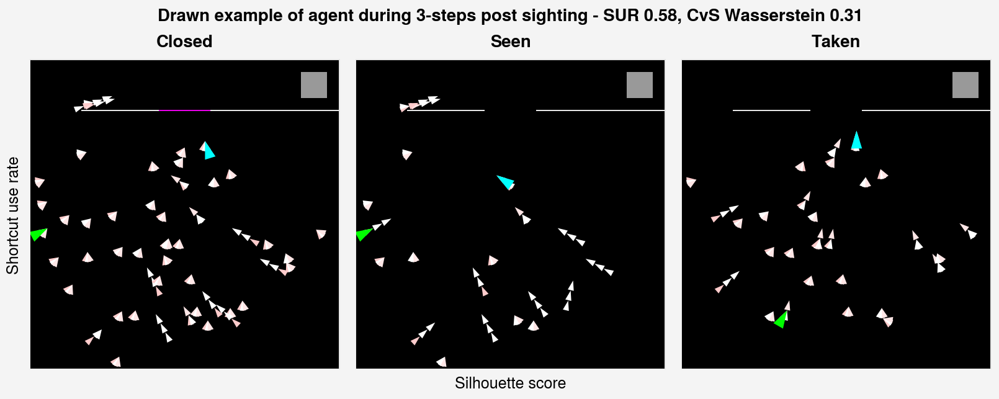

In [15]:
# The target copied agents 3-steps

activs = pickle.load(open('data/shortcut/wc1.5_policy_moreagents/shared1_activ', 'rb'))

p = 0.4
t = 8
key = f'{p}_{t}'
chk = 7
shortcut_res = activs[key]
res = shortcut_res[chk]
vis, avail, used, activ = res['vis'], res['shortcut_avail'], res['shortcut_used'], res['activ']
activ = np.vstack(activ)
activ2d = res['activ2d']
pos = np.vstack(res['pos'])
angle = np.vstack(res['angle'])
color = vision_decision_coloring(vis, avail, used, end=3)

sur = np.sum(used) / 50
silscore, _, _ = two_cloud_wasserstein(activ[color==0], activ[color==2], all_data=activ)


c_p = pos[color == 0]
s_p = pos[color == 1]
t_p = pos[color == 2]
c_a = angle[color == 0]
s_a = angle[color == 1]
t_a = angle[color == 2]

set_trajectory_plot_style()
fig, ax = pplt.subplots(ncols=3)

draw_trajectory(c_p, c_a, ax=ax[0])
draw_trajectory(s_p, s_a, ax=ax[1])
draw_trajectory(t_p, t_a, ax=ax[2])

draw_shortcut_maze(ax=ax[0], shortcut_open=False)
draw_shortcut_maze(ax=ax[1])
draw_shortcut_maze(ax=ax[2])

leftlabels = ['Closed', 'Seen', 'Taken']
ax.format(xlabel='Silhouette score', ylabel='Shortcut use rate',
         toplabels=leftlabels,
         suptitle=f'Drawn example of agent during 3-steps post sighting - SUR {sur:.2f}, CvS Wasserstein {silscore:.2f}',
         xlim=[0, 300], ylim=[0, 300])

pplt.rc.reset()

### Generate copied trajectories

In [14]:
'''Generate copied actions for the selected agents'''

chk = np.arange(40, 470, 40)[7]
p = 0.4
t = 8

num_episodes = 50
key = f'{p}_{t}'
model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 0,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

actions_ns = res['actions']

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
               env_kwargs={'character_reset_pos': 3,
                          'shortcut_probability': 1,
                          'wall_colors': 1.5},
           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
               num_episodes=num_episodes)

actions_ws = res['actions']

fa = {
    'ns': dict(zip(range(50), [a.squeeze() for a in actions_ns])),
    'ws': dict(zip(range(50), [a.squeeze() for a in actions_ws])),
    'seed': 1
}
pickle.dump(fa, open('data/shortcut/forced_actions_v2', 'wb'))

### wc1.5 collect activations

In [21]:
fa = pickle.load(open('data/shortcut/forced_actions_v2', 'rb'))

chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)
for x, (p, t) in enumerate(itertools.product(probs, trials)):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes, forced_actions=fa['ns'])

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': res['actions'],
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes, forced_actions=fa['ws'])

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': res['actions'],
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/wc1.5_copiedv2_moreagents/{key}', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████████████████| 11/11 [01:10<00:00,  6.43s/it]


### Copied v2 shortcut always open wc1.5 collect activations

## Copied with shortcut always open

In [4]:
fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']

chks = np.arange(40, 470, 40)
num_episodes = 100
probs = [0.1, 0.4]
trials = range(10)
for x, (p, t) in enumerate(itertools.product(probs, trials)):
    all_res = []

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 1,
                                          'wall_colors': 1.5},
                           seed=seed, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes, forced_actions=forced_actions)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res.append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        

    pickle.dump(all_res, open(f'data/shortcut/wc1.5_copied_moreagentsopen/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [01:18<00:00,  7.18s/it]


## Combine to single dict for easier loading later

In [319]:
    key = f'{p}_{t}'
    all_res = pickle.load(open(f'data/shortcut/wc1.5_policy_moreagents/{key}', 'rb'))


### Policy

#### wc1.5

In [4]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)

do_umap = True # flag to collect umaps

all_res = {}
for x, (p, t) in tqdm(enumerate(itertools.product(probs, trials)), total=20):
    
    
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_policy_moreagents/{key}', 'rb'))
    all_res[key] = []
    for i in range(len(chks)):
        res1 = shortcut_res['ns'][i]
        res2 = shortcut_res['ws'][i]
        
        pos = res1['ep_pos'] + res2['ep_pos']
        angle = res1['ep_angle'] + res2['ep_angle']
        vis = res1['vis'] + res2['vis']
        shortcut_avail = res1['shortcut'] + res2['shortcut']
        shortcut_used = [[check_shortcut_usage(p)] for p in pos]
        activ = [a['shared_activations'][1] for a in res1['activs']] + \
                [a['shared_activations'][1] for a in res2['activs']]
        
        # add umap
        umap = UMAP(min_dist=0.35)
        activ2d = umap.fit_transform(np.vstack(activ)).astype('float16')
        
        all_res[key].append({
            'pos': pos,
            'angle': angle,
            'vis': vis,
            'shortcut_avail': shortcut_avail,
            'shortcut_used': shortcut_used,
            'activ': activ,
            'activ2d': activ2d
        })
        
    
pickle.dump(all_res, open('data/shortcut/wc1.5_policy_moreagents/shared1_activ', 'wb'))

 20%|█████████████████▏                                                                    | 4/20 [29:49<2:09:34, 485.89s/it]C:\Users\14and\anaconda3\lib\site-packages\umap\spectral.py:260: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
 25%|█████████████████████▌                                                                | 5/20 [35:28<1:48:15, 433.00s/it]C:\Users\14and\anaconda3\lib\site-packages\umap\spectral.py:260: UserWarning: WARNING: spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
 45%|█████████████████████████████████████▎                                             | 9/20 [5:01:10<6:49:49, 2235.44s/it]C:\Users\14and\anaconda3\lib\site-pac

#### wc4

In [59]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)

all_res = {}
for x, (p, t) in tqdm(enumerate(itertools.product(probs, trials)), total=20):
    
    
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_policy_moreagents/{key}', 'rb'))
    all_res[key] = []
    for i in range(len(chks)):
        res1 = shortcut_res['ns'][i]
        res2 = shortcut_res['ws'][i]
        
        pos = res1['ep_pos'] + res2['ep_pos']
        vis = res1['vis'] + res2['vis']
        shortcut_avail = res1['shortcut'] + res2['shortcut']
        shortcut_used = [[check_shortcut_usage(p)] for p in pos]
        activ = [a['shared_activations'][1] for a in res1['activs']] + \
                [a['shared_activations'][1] for a in res2['activs']]
        
        all_res[key].append({
            'pos': pos,
            'vis': vis,
            'shortcut_avail': shortcut_avail,
            'shortcut_used': shortcut_used,
            'activ': activ
        })
        
    
pickle.dump(all_res, open('data/shortcut/wc4_policy_moreagents/shared1_activ', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:40<00:00,  2.02s/it]


### Copied

#### wc1.5


In [5]:
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied_moreagents/{key}', 'rb'))
shortcut_res[0].keys()

dict_keys(['activs', 'actions', 'ep_pos', 'ep_angle', 'vis', 'shortcut'])

In [6]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)

all_res = {}
for x, (p, t) in tqdm(enumerate(itertools.product(probs, trials)), total=20):
    
    
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied_moreagents/{key}', 'rb'))
    all_res[key] = []
    for i in range(len(chks)):
        res = shortcut_res[i]
        pos = res['ep_pos']
        vis = res['vis']
        shortcut_avail = res['shortcut']
        shortcut_used = [[check_shortcut_usage(p)] for p in pos]
        activ = [a['shared_activations'][1] for a in res['activs']]
        
        all_res[key].append({
            'pos': pos,
            'vis': vis,
            'shortcut_avail': shortcut_avail,
            'shortcut_used': shortcut_used,
            'activ': activ
        })
        
    
pickle.dump(all_res, open('data/shortcut/wc1.5_copied_moreagents/shared1_activ', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 20/20 [00:10<00:00,  1.84it/s]


#### wc4

In [7]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)

all_res = {}
for x, (p, t) in tqdm(enumerate(itertools.product(probs, trials)), total=20):
    
    
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied_moreagents/{key}', 'rb'))
    all_res[key] = []
    for i in range(len(chks)):
        res = shortcut_res[i]
        pos = res['ep_pos']
        vis = res['vis']
        shortcut_avail = res['shortcut']
        shortcut_used = [[check_shortcut_usage(p)] for p in pos]
        activ = [a['shared_activations'][1] for a in res['activs']]
        
        all_res[key].append({
            'pos': pos,
            'vis': vis,
            'shortcut_avail': shortcut_avail,
            'shortcut_used': shortcut_used,
            'activ': activ
        })
        
    
pickle.dump(all_res, open('data/shortcut/wc4_copied_moreagents/shared1_activ', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 20/20 [00:10<00:00,  1.84it/s]


### Copied v2

In [23]:
chks = np.arange(40, 470, 40)
num_episodes = 50
probs = [0.1, 0.4]
trials = range(10)

do_umap = True # flag to collect umaps

all_res = {}
for x, (p, t) in tqdm(enumerate(itertools.product(probs, trials)), total=20):
    
    
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copiedv2_moreagents/{key}', 'rb'))
    all_res[key] = []
    for i in range(len(chks)):
        res1 = shortcut_res['ns'][i]
        res2 = shortcut_res['ws'][i]
        
        pos = res1['ep_pos'] + res2['ep_pos']
        angle = res1['ep_angle'] + res2['ep_angle']
        vis = res1['vis'] + res2['vis']
        shortcut_avail = res1['shortcut'] + res2['shortcut']
        shortcut_used = [[check_shortcut_usage(p)] for p in pos]
        activ = [a['shared_activations'][1] for a in res1['activs']] + \
                [a['shared_activations'][1] for a in res2['activs']]
        
        # add umap
        umap = UMAP(min_dist=0.35)
        activ2d = umap.fit_transform(np.vstack(activ)).astype('float16')
        
        all_res[key].append({
            'pos': pos,
            'angle': angle,
            'vis': vis,
            'shortcut_avail': shortcut_avail,
            'shortcut_used': shortcut_used,
            'activ': activ,
            'activ2d': activ2d
        })
        
    
pickle.dump(all_res, open('data/shortcut/wc1.5_copiedv2_moreagents/shared1_activ', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████████████████| 20/20 [18:08<00:00, 54.43s/it]


## Data collection for nonorm0.4 and cloned0.1 agents

### p=0.4 -> p=0.1 clones wc1.5

In [257]:
chks = np.arange(10, 194, 20)
num_episodes = 50
clones = ['cloactor0', 'clofractor0']
trials = range(10)
for x, (clone, t) in enumerate(itertools.product(clones, trials)):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{clone}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc1.5p0.1batch256', subdir='shortcut_clonewc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/clone_wc1.5/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [03:46<00:00, 22.62s/it]


### p=0.4 -> p=0.1 clones wc4

In [258]:
chks = np.arange(10, 194, 20)
num_episodes = 50
clones = ['cloactor0', 'clofractor0']
trials = range(10)
for x, (clone, t) in enumerate(itertools.product(clones, trials)):
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{clone}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm{clone}_wc4p0.1batch256', subdir='shortcut_clonewc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 4},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 4},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/clone_wc4/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [01:27<00:00,  8.73s/it]


### p=0.4 wc1.5 nonorm

In [260]:
chks = np.arange(20, 389, 40)
num_episodes = 50
p = 0.4
trials = range(10)
for t in trials:
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm_wc1.5p{p}batch256', subdir='shortcut_clonewc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/clone_wc1.5/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:25<00:00, 14.51s/it]


### p=0.4 wc4 nonorm

In [261]:
chks = np.arange(20, 389, 40)
num_episodes = 50
p = 0.4
trials = range(10)
for t in trials:
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm_wc4p{p}batch256', subdir='shortcut_clonewc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 4},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 4},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/clone_wc4/{key}', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [01:05<00:00,  6.52s/it]


### p=0.1 wc1.5 nonorm

In [4]:
chks = np.arange(20, 389, 40)
num_episodes = 50
p = 0.1
trials = range(10)
for t in trials:
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm_wc1.5p{p}batch256', subdir='shortcut_clonewc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 1.5},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 1.5},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/clone_wc1.5/{key}', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 10/10 [05:03<00:00, 30.38s/it]


### p=0.4 wc4 nonorm

In [ ]:
chks = np.arange(20, 389, 40)
num_episodes = 50
p = 0.1
trials = range(10)
for t in trials:
    all_res = {
        'ws': [],
        'ns': []
    }

    key = f'{p}_{t}'
    for chk in tqdm(chks):
        model, obs_rms = load_chk(f'shortcut_nonorm_wc4p{p}batch256', subdir='shortcut_clonewc2', trial=t, chk=chk)

        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                               env_kwargs={'character_reset_pos': 3,
                                          'shortcut_probability': 0,
                                          'wall_colors': 4},
                           seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                               num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ns'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
        res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 1,
                                  'wall_colors': 4},
                   seed=1, with_activations=True, data_callback=shortcut_visdata_callback,
                       num_episodes=num_episodes)

        '''Collect up to first+nth step of seeing shortcut
        where first is the first step seeing the shortcut'''
        activs = ep_stack_activations(res, half=True)

        all_res['ws'].append({
            'activs': activs,
            'actions': actions,
            'ep_pos': res['data']['pos'],
            'ep_angle': res['data']['angle'],
            'vis': res['data']['shortcut_vis'],
            'shortcut': res['data']['shortcut']
        })
        
    pickle.dump(all_res, open(f'data/shortcut/clone_wc4/{key}', 'wb'))

100%|████████████████████████████████████████████████████████████████████████████| 10/10 [01:50<00:00, 11.05s/it]


### Combining to single dict for loading

#### wc1.5

In [263]:
all_res = {}

chks1 = np.arange(10, 194, 20)
chks2 = np.arange(20, 389, 40)
num_episodes = 50
clones = ['cloactor0', 'clofractor0', '0.4']
trials = range(10)
for clone, t in tqdm(itertools.product(clones, trials), total=30):
    if clone in ['cloactor0', 'clofractor0']:
        chks = chks1
    else:
        chks = chks2
    
    key = f'{clone}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/clone_wc1.5/{key}', 'rb'))
    all_res[key] = []
    for i in range(len(chks)):
        res1 = shortcut_res['ns'][i]
        res2 = shortcut_res['ws'][i]
        
        pos = res1['ep_pos'] + res2['ep_pos']
        vis = res1['vis'] + res2['vis']
        shortcut_avail = res1['shortcut'] + res2['shortcut']
        shortcut_used = [[check_shortcut_usage(p)] for p in pos]
        activ = [a['shared_activations'][1] for a in res1['activs']] + \
                [a['shared_activations'][1] for a in res2['activs']]
        
        all_res[key].append({
            'pos': pos,
            'vis': vis,
            'shortcut_avail': shortcut_avail,
            'shortcut_used': shortcut_used,
            'activ': activ
        })
        
    
pickle.dump(all_res, open('data/shortcut/clone_wc1.5/shared1_activ', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:24<00:00,  1.21it/s]


#### wc4

In [264]:
all_res = {}

chks1 = np.arange(10, 194, 20)
chks2 = np.arange(20, 389, 40)
num_episodes = 50
clones = ['cloactor0', 'clofractor0', '0.4']
trials = range(10)
for clone, t in tqdm(itertools.product(clones, trials), total=30):
    if clone in ['cloactor0', 'clofractor0']:
        chks = chks1
    else:
        chks = chks2
    
    key = f'{clone}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/clone_wc4/{key}', 'rb'))
    all_res[key] = []
    for i in range(len(chks)):
        res1 = shortcut_res['ns'][i]
        res2 = shortcut_res['ws'][i]
        
        pos = res1['ep_pos'] + res2['ep_pos']
        vis = res1['vis'] + res2['vis']
        shortcut_avail = res1['shortcut'] + res2['shortcut']
        shortcut_used = [[check_shortcut_usage(p)] for p in pos]
        activ = [a['shared_activations'][1] for a in res1['activs']] + \
                [a['shared_activations'][1] for a in res2['activs']]
        
        all_res[key].append({
            'pos': pos,
            'vis': vis,
            'shortcut_avail': shortcut_avail,
            'shortcut_used': shortcut_used,
            'activ': activ
        })
        
    
pickle.dump(all_res, open('data/shortcut/clone_wc4/shared1_activ', 'wb'))

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [00:41<00:00,  1.37s/it]


# Plot activations and positions

In [ ]:
fig, ax = pplt.subplots(nrows=8, ncols=6, sharey=False, sharex=False)

leftlabels = []
for i in range(8):
    res = shortcut_res[i*3]
    activ2d = res['activ2d']
    pos = res['pos']
    
    labels, no_cluster = decompose_shortcut_trajectories(res)
    silscore = two_set_silhouette_score(activ2d[labels == 1], activ2d[labels == 2])
    leftlabels.append(f'{silscore:.3f}')
    kmeans_activ_pos_plot(pos, activ2d, labels=labels, ax=ax[i, :])
    

ax[:, 1:].format(xlim=[0, 300], ylim=[0, 300], leftlabels=leftlabels)


## Forced Trajectories - plot all umaps

In [ ]:
fig, ax = pplt.subplots(nrows=9, ncols=5, sharey=False, sharex=False)



silscores = []
leftlabels = []
probs = [0.1, 0.2, 0.4]
trials = range(3)
for i, (p, t) in enumerate(itertools.product(probs, trials)):
    key = f'64_{p}_{t}'
    leftlabels.append(f'p={p}, t{t}')
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{key}', 'rb'))

    for j in range(5):
        res = shortcut_res[j*5]
        activ2d = res['activ2d']
        pos = res['pos']

        labels, no_cluster = decompose_shortcut_trajectories(res)
        silscore = two_set_silhouette_score(activ2d[labels == 1], activ2d[labels == 2])
        silscores.append(f'{silscore:.3f}')
        for n in range(5):
            idxs = labels == n
            ax[i, j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[n])


ax.format(title=silscores, leftlabels=leftlabels)


In [ ]:
fig, ax = pplt.subplots(nrows=9, ncols=5, sharey=False, sharex=False)



silscores = []
leftlabels = []
probs = [0.1, 0.2, 0.4]
trials = range(3)
for i, (p, t) in enumerate(itertools.product(probs, trials)):
    key = f'{p}_{t}'
    leftlabels.append(f'p={p}, t{t}')
    shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))

    for j in range(5):
        res = shortcut_res[j*5]
        activ2d = res['activ2d']
        pos = res['pos']

        labels, no_cluster = decompose_shortcut_trajectories(res)
        silscore = two_set_silhouette_score(activ2d[labels == 1], activ2d[labels == 2])
        silscores.append(f'{silscore:.3f}')
        for n in range(5):
            idxs = labels == n
            ax[i, j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[n])


ax.format(title=silscores, leftlabels=leftlabels)


## Policy - no shortcut

In [ ]:
activs = activs_list_to_dict(res['activs'])
a_pca = PCA().fit_transform(activs['shared_activations'][1])
fig, ax = pplt.subplots()
ax.scatter(a_pca[:, 0], a_pca[:, 1], alpha=0.1)

In [ ]:
# fig, ax = pplt.subplots(ncols=3)
dists = [0.5, 0.75, 1.0]
res1 = shortcut_res['ns'][20]
res2 = shortcut_res['ws'][20]
activs1 = activs_list_to_dict(res1['activs'])
activs2 = activs_list_to_dict(res2['activs'])

In [ ]:
fig, ax = pplt.subplots(ncols=2)
a_pca = PCA().fit_transform(activs1['shared_activations'][1])
ax[0].scatter(a_pca[:, 0], a_pca[:, 1], alpha=0.1)
a_pca = PCA().fit_transform(activs2['shared_activations'][1])
ax[1].scatter(a_pca[:, 0], a_pca[:, 1], alpha=0.1)

In [ ]:
KMeans(

In [ ]:
pos = np.vstack(res1['ep_pos'])
a_pca = PCA().fit_transform(activs1['shared_activations'][1])
labels = KMeans(n_clusters=3).fit_predict(a_pca[:, :2])
fig, ax = pplt.subplots(ncols=4, sharey=False)
for i in range(3):
    idxs = labels == i
    ax[0].scatter(a_pca[idxs, 0], a_pca[idxs, 1], alpha=0.1, color=rgb_colors[i])
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.3, color=rgb_colors[i])
    
ax[1:].format(xlim=[0, 300], ylim=[0, 300])


In [ ]:
pos = np.vstack(res2['ep_pos'])
a_pca = PCA().fit_transform(activs2['shared_activations'][1])
labels = KMeans(n_clusters=3).fit_predict(a_pca[:, :2])
fig, ax = pplt.subplots(ncols=4, sharey=False)
for i in range(3):
    idxs = labels == i
    ax[0].scatter(a_pca[idxs, 0], a_pca[idxs, 1], alpha=0.1, color=rgb_colors[i])
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.3, color=rgb_colors[i])
    
ax[1:].format(xlim=[0, 300], ylim=[0, 300])


In [ ]:
# fig, ax = pplt.subplots(ncols=3)
dists = [0.5, 0.75, 1.0]
res1 = shortcut_res['ns'][20]
res2 = shortcut_res['ws'][20]
activs1 = activs_list_to_dict(res1['activs'])
activs2 = activs_list_to_dict(res2['activs'])

pos1 = np.vstack(res1['ep_pos'])
pos2 = np.vstack(res2['ep_pos'])
pos = np.vstack([pos1, pos2])

activ1 = activs1['shared_activations'][1]
activ2 = activs2['shared_activations'][1]
activ = torch.vstack([activ1, activ2])

a_pca = PCA().fit_transform(activ)

labels = KMeans(n_clusters=3).fit_predict(a_pca[:, :2])
fig, ax = pplt.subplots(ncols=4, sharey=False)
for i in range(3):
    idxs = labels == i
    ax[0].scatter(a_pca[idxs, 0], a_pca[idxs, 1], alpha=0.1, color=rgb_colors[i])
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.3, color=rgb_colors[i])
    
ax[1:].format(xlim=[0, 300], ylim=[0, 300])


In [ ]:
dists = [0.5, 0.75, 1.0]
res1 = shortcut_res['ns'][20]
res2 = shortcut_res['ws'][20]
activs1 = activs_list_to_dict(res1['activs'])
activs2 = activs_list_to_dict(res2['activs'])

pos1 = np.vstack(res1['ep_pos'])
pos2 = np.vstack(res2['ep_pos'])
pos = np.vstack([pos1, pos2])

activ1 = activs1['shared_activations'][1]
activ2 = activs2['shared_activations'][1]
activ = torch.vstack([activ1, activ2])

a_pca = PCA().fit_transform(activ)

fig, ax = pplt.subplots(ncols=4, sharey=False)


dists = [0.25, 0.5, 0.75, 1.0]
activ2ds = []
for j, dist in enumerate(dists):
    activ2d = UMAP(min_dist=dist).fit_transform(activ)
    activ2ds.append(activ2d)
    
    labels = KMeans(n_clusters=5).fit_predict(activ2d)
    for i in range(5):
        idxs = labels == i
        ax[j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[i])


In [ ]:
shortcut_res = pickle.load(open('data/shortcut/wc1.5_policy/0.1_0', 'rb'))

dists = [0.5, 0.75, 1.0]
res1 = shortcut_res['ns'][20]
res2 = shortcut_res['ws'][20]
activs1 = activs_list_to_dict(res1['activs'])
activs2 = activs_list_to_dict(res2['activs'])

pos1 = np.vstack(res1['ep_pos'])
pos2 = np.vstack(res2['ep_pos'])
pos = np.vstack([pos1, pos2])

activ1 = activs1['shared_activations'][1]
activ2 = activs2['shared_activations'][1]
activ = torch.vstack([activ1, activ2])

a_pca = PCA().fit_transform(activ)

fig, ax = pplt.subplots(ncols=4, sharey=False)


dists = [0.25, 0.5, 0.75, 1.0]
activ2ds = []
for j, dist in enumerate(dists):
    activ2d = UMAP(min_dist=dist).fit_transform(activ)
    activ2ds.append(activ2d)
    
    labels = KMeans(n_clusters=5).fit_predict(activ2d)
    for i in range(5):
        idxs = labels == i
        ax[j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[i])


In [ ]:
len(pos)

In [ ]:
shortcut_res = pickle.load(open('data/shortcut/wc1.5_policy/0.1_0', 'rb'))

dists = [0.5, 0.75, 1.0]
res1 = shortcut_res['ns'][20]
res2 = shortcut_res['ws'][20]
activs1 = activs_list_to_dict(res1['activs'][:50])
activs2 = activs_list_to_dict(res2['activs'][:50])

pos1 = np.vstack(res1['ep_pos'][:50])
pos2 = np.vstack(res2['ep_pos'][:50])
pos = np.vstack([pos1, pos2])

activ1 = activs1['shared_activations'][1]
activ2 = activs2['shared_activations'][1]
activ = torch.vstack([activ1, activ2])

a_pca = PCA().fit_transform(activ)

fig, ax = pplt.subplots(ncols=4, sharey=False)


dists = [0.25, 0.5, 0.75, 1.0]
activ2ds = []
for j, dist in enumerate(dists):
    activ2d = UMAP(min_dist=dist).fit_transform(activ)
    activ2ds.append(activ2d)
    
    labels = KMeans(n_clusters=5).fit_predict(activ2d)
    for i in range(5):
        idxs = labels == i
        ax[j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[i])


In [ ]:
shortcut_res = pickle.load(open('data/shortcut/wc1.5_policy/0.1_0', 'rb'))

dists = [0.5, 0.75, 1.0]
res1 = shortcut_res['ns'][16]
res2 = shortcut_res['ws'][16]
activs1 = activs_list_to_dict(res1['activs'][:50])
activs2 = activs_list_to_dict(res2['activs'][:50])

pos1 = np.vstack(res1['ep_pos'][:50])
pos2 = np.vstack(res2['ep_pos'][:50])
pos = np.vstack([pos1, pos2])

activ1 = activs1['shared_activations'][1]
activ2 = activs2['shared_activations'][1]
activ = torch.vstack([activ1, activ2])

a_pca = PCA().fit_transform(activ)

fig, ax = pplt.subplots(ncols=4, sharey=False)


dists = [0.25, 0.5, 0.75, 1.0]
activ2ds = []
for j, dist in enumerate(dists):
    activ2d = UMAP(min_dist=dist).fit_transform(activ)
    activ2ds.append(activ2d)
    
    labels = KMeans(n_clusters=5).fit_predict(activ2d)
    for i in range(5):
        idxs = labels == i
        ax[j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[i])


In [ ]:
a = activ2ds[0]
labels = KMeans(n_clusters=5).fit_predict(a)
kmeans_activ_pos_plot(pos, a, labels)

In [ ]:
a = activ2ds[1]
labels = KMeans(n_clusters=5).fit_predict(a)
kmeans_activ_pos_plot(pos, a, labels)

In [ ]:
shortcut_res = pickle.load(open('data/shortcut/wc1.5_policy/0.1_0', 'rb'))

dists = [0.5, 0.75, 1.0]
res1 = shortcut_res['ns'][16]
res2 = shortcut_res['ws'][16]
activs1 = activs_list_to_dict(res1['activs'])
activs2 = activs_list_to_dict(res2['activs'])

pos1 = np.vstack(res1['ep_pos'])
pos2 = np.vstack(res2['ep_pos'])
pos = np.vstack([pos1, pos2])

activ1 = activs1['shared_activations'][1]
activ2 = activs2['shared_activations'][1]
activ = torch.vstack([activ1, activ2])

a_pca = PCA().fit_transform(activ)

fig, ax = pplt.subplots(ncols=4, sharey=False)


dists = [0.25, 0.5, 0.75, 1.0]
activ2ds = []
for j, dist in enumerate(dists):
    activ2d = UMAP(min_dist=dist).fit_transform(activ)
    activ2ds.append(activ2d)
    
    labels = KMeans(n_clusters=5).fit_predict(activ2d)
    for i in range(5):
        idxs = labels == i
        ax[j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[i])


In [ ]:
a = activ2ds[0]
labels = KMeans(n_clusters=5).fit_predict(a)
kmeans_activ_pos_plot(pos, a, labels)

In [ ]:
a = activ2ds[1]
labels = KMeans(n_clusters=5).fit_predict(a)
kmeans_activ_pos_plot(pos, a, labels)

In [ ]:
activ2d = activ2ds[0]
labels = KMeans(n_clusters=5).fit_predict(activ2d)
fig, ax = pplt.subplots(ncols=6, sharey=False)
for i in range(5):
    idxs = labels == i
    ax[0].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[i])
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.3, color=rgb_colors[i])
    
ax[1:].format(xlim=[0, 300], ylim=[0, 300])


In [ ]:
len(pos)

In [ ]:
shortcut_res = pickle.load(open('data/shortcut/wc4_policy/0.4_0', 'rb'))

res1 = shortcut_res['ns'][21]
res2 = shortcut_res['ws'][21]
activs1 = activs_list_to_dict(res1['activs'])
activs2 = activs_list_to_dict(res2['activs'])

pos1 = np.vstack(res1['ep_pos'])
pos2 = np.vstack(res2['ep_pos'])
pos = np.vstack([pos1, pos2])

activ1 = activs1['shared_activations'][1]
activ2 = activs2['shared_activations'][1]
activ = torch.vstack([activ1, activ2])

a_pca = PCA().fit_transform(activ)

fig, ax = pplt.subplots(ncols=4, sharey=False)


dists = [0.15, 0.25, 0.5, 0.75]
activ2ds = []
for j, dist in enumerate(dists):
    activ2d = UMAP(min_dist=dist).fit_transform(activ)
    activ2ds.append(activ2d)
    
    labels = KMeans(n_clusters=5).fit_predict(activ2d)
    for i in range(5):
        idxs = labels == i
        ax[j].scatter(activ2d[idxs, 0], activ2d[idxs, 1], alpha=0.1, color=rgb_colors[i])


In [ ]:
pickle.dump(activ2d, open('data/shortcut/test', 'wb'))

In [ ]:
len(shortcut_res['ns'])

# Visualize UMAP min_dist clusterings - Concl: 0.5 best

Some of the smaller min_dists like 0.15 and 0.25 sometimes split data points more cleanly which might be better for kmeans, but maybe lose structure too. 0.25 or 0.5 are visually the most optimal

## wc4

In [ ]:
chks = np.arange(40, 470, 20)

chk_idxs = [16, 18, 20, 21]

fig, ax = pplt.subplots(ncols=4, nrows=9, sharex=False, sharey=False)
all_activ2ds = pickle.load(open('data/shortcut/wc4_policy/activ2ds', 'rb'))

dists = [0.15, 0.25, 0.5, 0.75]
dist_idx = 0 #use 0.15 min_dist umaps

leftlabels = []

for i, key in enumerate(all_activ2ds):
    leftlabels.append(key)
    for j, chk in enumerate(chk_idxs):
        if chk in all_activ2ds[key]:
            a = all_activ2ds[key][chk][dist_idx]
            ax[i, j].scatter(a[:, 0], a[:, 1], alpha=0.1)
            
ax.format(leftlabels=leftlabels, 
          toplabels=[f'{chks[chk_idx]}' for chk_idx in chk_idxs])
            

In [ ]:
chks = np.arange(40, 470, 20)

chk_idxs = [16, 18, 20, 21]

fig, ax = pplt.subplots(ncols=4, nrows=9, sharex=False, sharey=False)
all_activ2ds = pickle.load(open('data/shortcut/wc4_policy/activ2ds', 'rb'))

dists = [0.15, 0.25, 0.5, 0.75]
dist_idx = 1 #use 0.25 min_dist umaps

leftlabels = []

for i, key in enumerate(all_activ2ds):
    leftlabels.append(key)
    for j, chk in enumerate(chk_idxs):
        if chk in all_activ2ds[key]:
            a = all_activ2ds[key][chk][dist_idx]
            ax[i, j].scatter(a[:, 0], a[:, 1], alpha=0.1)
            
ax.format(leftlabels=leftlabels, 
          toplabels=[f'{chks[chk_idx]}' for chk_idx in chk_idxs])
            

In [ ]:
chks = np.arange(40, 470, 20)

chk_idxs = [16, 18, 20, 21]

fig, ax = pplt.subplots(ncols=4, nrows=9, sharex=False, sharey=False)
all_activ2ds = pickle.load(open('data/shortcut/wc4_policy/activ2ds', 'rb'))

dists = [0.15, 0.25, 0.5, 0.75]
dist_idx = 2 #use 0.25 min_dist umaps

leftlabels = []

for i, key in enumerate(all_activ2ds):
    leftlabels.append(key)
    for j, chk in enumerate(chk_idxs):
        if chk in all_activ2ds[key]:
            a = all_activ2ds[key][chk][dist_idx]
            ax[i, j].scatter(a[:, 0], a[:, 1], alpha=0.1)
            
ax.format(leftlabels=leftlabels, 
          toplabels=[f'{chks[chk_idx]}' for chk_idx in chk_idxs])
            

## wc1.5

In [ ]:
chks = np.arange(40, 470, 20)

chk_idxs = [16, 18, 20, 21]

fig, ax = pplt.subplots(ncols=4, nrows=9, sharex=False, sharey=False)
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_policy/activ2ds', 'rb'))

dists = [0.15, 0.25, 0.5, 0.75]
dist_idx = 0 #use 0.15 min_dist umaps

leftlabels = []

for i, key in enumerate(all_activ2ds):
    leftlabels.append(key)
    for j, chk in enumerate(chk_idxs):
        if chk in all_activ2ds[key]:
            a = all_activ2ds[key][chk][dist_idx]
            ax[i, j].scatter(a[:, 0], a[:, 1], alpha=0.1)
            
ax.format(leftlabels=leftlabels, 
          toplabels=[f'{chks[chk_idx]}' for chk_idx in chk_idxs])
            

In [ ]:
chks = np.arange(40, 470, 20)

chk_idxs = [16, 18, 20, 21]

fig, ax = pplt.subplots(ncols=4, nrows=9, sharex=False, sharey=False)
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_policy/activ2ds', 'rb'))

dists = [0.15, 0.25, 0.5, 0.75]
dist_idx = 1 #use 0.25 min_dist umaps

leftlabels = []

for i, key in enumerate(all_activ2ds):
    leftlabels.append(key)
    for j, chk in enumerate(chk_idxs):
        if chk in all_activ2ds[key]:
            a = all_activ2ds[key][chk][dist_idx]
            ax[i, j].scatter(a[:, 0], a[:, 1], alpha=0.1)
            
ax.format(leftlabels=leftlabels, 
          toplabels=[f'{chks[chk_idx]}' for chk_idx in chk_idxs])
            

In [ ]:
chks = np.arange(40, 470, 20)

chk_idxs = [16, 18, 20, 21]

fig, ax = pplt.subplots(ncols=4, nrows=9, sharex=False, sharey=False)
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_policy/activ2ds', 'rb'))

dists = [0.15, 0.25, 0.5, 0.75]
dist_idx = 2 #use 0.5 min_dist umaps

leftlabels = []

for i, key in enumerate(all_activ2ds):
    leftlabels.append(key)
    for j, chk in enumerate(chk_idxs):
        if chk in all_activ2ds[key]:
            a = all_activ2ds[key][chk][dist_idx]
            ax[i, j].scatter(a[:, 0], a[:, 1], alpha=0.1)
            
ax.format(leftlabels=leftlabels, 
          toplabels=[f'{chks[chk_idx]}' for chk_idx in chk_idxs])
            

# Coloring based on decision

## Policy: first 10 steps after seeing shortcut opening

There is noticeably less overlap in these activations for wc4 agents, but notice that there is also clearer separation in the trajectories taken, indicating that they have better efficiency in traveling towards the shortcut/entrance after seeing as well.

Note that 0.2_2 agents in both wc4 and wc1.5 cases were unable to learn effectively... Interesting - the shared initialization of weights made the task harder to learn perhaps? Another suggestion to look into about transfering weights

In [ ]:
leftlabels

In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_policy/activ2ds', 'rb'))


In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_policy/activ2ds', 'rb'))

#Note using 8 rows here because we know 0.2_2 is going to be skipped over
fig, ax = pplt.subplots(nrows=8, ncols=5, sharex=False, sharey=False, figwidth=8)
leftlabels = []
count = 0
for i, key in enumerate(all_activ2ds):    
    avail_chks = list(all_activ2ds[key]['activ2d'].keys())
    if len(avail_chks) == 0:
        continue
    chk_idx = np.max(avail_chks)
    
    r = all_activ2ds[key]
    activ2d = r['activ2d'][chk_idx][2]
    _, color, pos = comb_policy_res(r, chk_idx, vis_n=10)
    colored_activ2d_plot(activ2d, color, pos, split_activ=True, ax=ax[count, :])
    
    score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
    leftlabels.append(f'{key}, {score:.3f}')
    count += 1
    
ax.format(leftlabels=leftlabels,
          toplabels=['UMAP', 'UMAP no shortc.', 'UMAP w/shortc.', 'Pos no shortc.', 'Pos w/shortc.'],
         xticks=[], yticks=[])

In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_policy/activ2ds', 'rb'))

fig, ax = pplt.subplots(nrows=8, ncols=5, sharex=False, sharey=False, figwidth=8)
leftlabels = []
count = 0
for i, key in enumerate(all_activ2ds):    
    avail_chks = list(all_activ2ds[key]['activ2d'].keys())
    if len(avail_chks) == 0:
        continue
    chk_idx = np.max(avail_chks)
    
    r = all_activ2ds[key]
    activ2d = r['activ2d'][chk_idx][2]
    _, color, pos = comb_policy_res(r, chk_idx, vis_n=10)
    colored_activ2d_plot(activ2d, color, pos, split_activ=True, ax=ax[count, :])
    
    score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
    leftlabels.append(f'{key}, {score:.3f}')
    count += 1
    
ax.format(leftlabels=leftlabels,
          toplabels=['UMAP', 'UMAP no shortc.', 'UMAP w/shortc.', 'Pos no shortc.', 'Pos w/shortc.'],
         xticks=[], yticks=[])

## Forced trajectory: first 10 steps after seeing shortcut

In [369]:
fa = pickle.load(open('data/shortcut/forced_actions', 'rb'))
forced_actions = fa['forced_actions']
seed = fa['seed']

model, obs_rms = load_chk(f'shortcut_wc1.5p{p}', subdir='shortcut_wc', trial=t, chk=460)

res = forced_action_evaluate(model, obs_rms, env_name='ShortcutNav-v0', 
                       env_kwargs={'character_reset_pos': 3,
                                  'shortcut_probability': 0.5,
                                  'wall_colors': 1.5},
                   seed=seed, with_activations=True, data_callback=shortcut_visdata_callback,
                    num_episodes=100, forced_actions=forced_actions)


forced_vis = res['data']['shortcut_vis'].copy()
forced_shortcut = res['data']['shortcut'].copy()

In [ ]:
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.1_0', 'rb'))
color = vision_coloring(forced_vis, forced_shortcut, num_steps=10)

fig, ax = pplt.subplots(nrows=5, ncols=3)

for i in range(5):
    res2 = shortcut_res[i*5+1]
    activ2d = res2['activ2d']
    colored_activ2d_plot(activ2d, color, split_activ=True, ax=ax[i, :])
    

In [ ]:
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.4_0', 'rb'))
color = vision_coloring(forced_vis, forced_shortcut, num_steps=10)

fig, ax = pplt.subplots(nrows=5, ncols=3)

for i in range(5):
    res2 = shortcut_res[i*5+1]
    activ2d = res2['activ2d']
    colored_activ2d_plot(activ2d, color, split_activ=True, ax=ax[i, :])
    

In [ ]:
shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/64_0.4_0', 'rb'))
color = vision_coloring(forced_vis, forced_shortcut, num_steps=10)

fig, ax = pplt.subplots(nrows=5, ncols=3)

for i in range(5):
    res2 = shortcut_res[i*5+1]
    activ2d = res2['activ2d']
    colored_activ2d_plot(activ2d, color, split_activ=True, ax=ax[i, :])
    

## Policy: 10 steps after "decision"

## Forced: 10 steps after "decision"

In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

fig, ax = pplt.subplots(nrows=3, ncols=3)

key = '0.4_1'
activ2d = all_activ2ds[key][-1]['activ2d']
n_steps = 2
title = []
leftlabels = []

# Color based on 10 steps after "decision"
color = decision_coloring(vis, shortcut_used, n_steps)
colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
title += [f'{score:.2f}',  '',  '']
leftlabels.append('Decision, natural')

# Color based on 10 steps after "seeing"
color = decision_coloring(vis, shortcut_avail, n_steps)
colored_activ2d_plot(activ2d, color, ax=ax[1, :], split_activ=True)
score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
title += [f'{score:.2f}',  '',  '']
leftlabels.append('Vision, natural')

# Color based on 10 steps after "decision" with shortcut always open
activ2d = all_activ2ds2[key][-1]['activ2d']
vis = all_activ2ds2['vis']
shortcut_avail = all_activ2ds2['shortcut']
shortcut_used = all_activ2ds2['shortcut_used']
color = decision_coloring(vis, shortcut_used, n_steps)
colored_activ2d_plot(activ2d, color, ax=ax[2, :], split_activ=True)
score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
title += [f'{score:.2f}',  '',  '']
leftlabels.append('Decision, always open')

# Color based on 10 steps after "decision"
# color = decision_coloring(vis, shortcut_used)
# colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
# score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
# title += [f'{score:.2f}',  '',  '']
# leftlabels.append('Decision, natural')


ax.format(leftlabels=leftlabels, title=title)


In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc1.5_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

fig, ax = pplt.subplots(nrows=2, ncols=3)

key = '0.1_0'
activ2d = all_activ2ds[key][-1]['activ2d']

title = []
leftlabels = []

# Color based on 10 steps after "decision"
color = decision_coloring(vis, shortcut_used)
colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
title += [f'{score:.2f}',  '',  '']
leftlabels.append('Decision, natural')

# Color based on 10 steps after "seeing"
color = decision_coloring(vis, shortcut_avail)
colored_activ2d_plot(activ2d, color, ax=ax[1, :], split_activ=True)
score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
title += [f'{score:.2f}',  '',  '']
leftlabels.append('Vision, natural')

# Color based on 10 steps after "decision" with shortcut always open
# activ2d = all_activ2ds2[key][-1]['activ2d']
# vis = all_activ2ds2['vis']
# shortcut_avail = all_activ2ds2['shortcut']
# shortcut_used = all_activ2ds2['shortcut_used']
# color = decision_coloring(vis, shortcut_used)
# colored_activ2d_plot(activ2d, color, ax=ax[2, :], split_activ=True)
# score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
# title += [f'{score:.2f}',  '',  '']
# leftlabels.append('Decision, always open')

# Color based on 10 steps after "decision"
# color = decision_coloring(vis, shortcut_used)
# colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
# score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
# title += [f'{score:.2f}',  '',  '']
# leftlabels.append('Decision, natural')


ax.format(leftlabels=leftlabels, title=title)


### More visual inspection of silhouettes

In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc1.5_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

fig, ax = pplt.subplots(nrows=1, ncols=4)

key = '0.1_0'
activ2d = all_activ2ds[key][-1]['activ2d']

title = []
leftlabels = []

# Color based on 10 steps after "decision"
color = vision_decision_coloring(vis, shortcut_avail, shortcut_used)
colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
score1 = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
score2 = two_set_silhouette_score(activ2d[color==1], activ2d[color==2])
score3 = two_set_silhouette_score(activ2d[color==0], activ2d[color==2])

title += [f'',  f'{score1:.2f}',  f'{score2:.2f}', f'{score3:.2f}']

ax.format(toplabels=['UMAP', 'No shortcut avail.', 'Shortcut avail. not used', 'Shortcut used.'], title=title)


In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc1.5_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

fig, ax = pplt.subplots(nrows=1, ncols=4)

key = '0.1_0'
activ2d = all_activ2ds[key][-1]['activ2d']
activ = all_activ2ds[key][-1]['activ']

title = []
leftlabels = []

# Color based on 10 steps after "decision"
color = vision_decision_coloring(vis, shortcut_avail, shortcut_used)
colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
score3 = two_set_silhouette_score(activ[color==0], activ[color==2])

title += [f'',  f'{score1:.2f}',  f'{score2:.2f}', f'{score3:.2f}']

ax.format(toplabels=['UMAP', 'No shortcut avail.', 'Shortcut avail. not used', 'Shortcut used.'], title=title)


In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

fig, ax = pplt.subplots(nrows=1, ncols=4)

key = '0.1_0'
activ2d = all_activ2ds[key][-1]['activ2d']

title = []
leftlabels = []

# Color based on 10 steps after "decision"
color = vision_decision_coloring(vis, shortcut_avail, shortcut_used)
colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
score1 = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
score2 = two_set_silhouette_score(activ2d[color==1], activ2d[color==2])
score3 = two_set_silhouette_score(activ2d[color==0], activ2d[color==2])

title += [f'',  f'{score1:.2f}',  f'{score2:.2f}', f'{score3:.2f}']

ax.format(toplabels=['UMAP', 'No shortcut avail.', 'Shortcut avail. not used', 'Shortcut used.'], title=title)


In [ ]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

fig, ax = pplt.subplots(nrows=1, ncols=4)

key = '0.1_0'
activ2d = all_activ2ds[key][-1]['activ2d']
activ = all_activ2ds[key][-1]['activ']

title = []
leftlabels = []

# Color based on 10 steps after "decision"
color = vision_decision_coloring(vis, shortcut_avail, shortcut_used)
colored_activ2d_plot(activ2d, color, ax=ax[0, :], split_activ=True)
score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
score3 = two_set_silhouette_score(activ[color==0], activ[color==2])

title += [f'',  f'{score1:.2f}',  f'{score2:.2f}', f'{score3:.2f}']

ax.format(toplabels=['UMAP', 'No shortcut avail.', 'Shortcut avail. not used', 'Shortcut used.'], title=title)


### Boxplots for last training

Interestingly... activations seems to change significantly when a "decision" is made rather than dependent on the shortcut being there or not. The exact opposite is true of wc1.5.

This might be interpreted as meaning that upon seeing the shortcut being there or not, wc1.5 agents have a large change in their internal activaion... Maybe this is because they need to process the fact that the shortcut is there and hold it in memory, whereas wc4 agents can continuously act on visual information. Since wc1.5 cannot rely on the visual information as much, they need to have a bigger shift in activation to hold in memory the shortcut being open or not

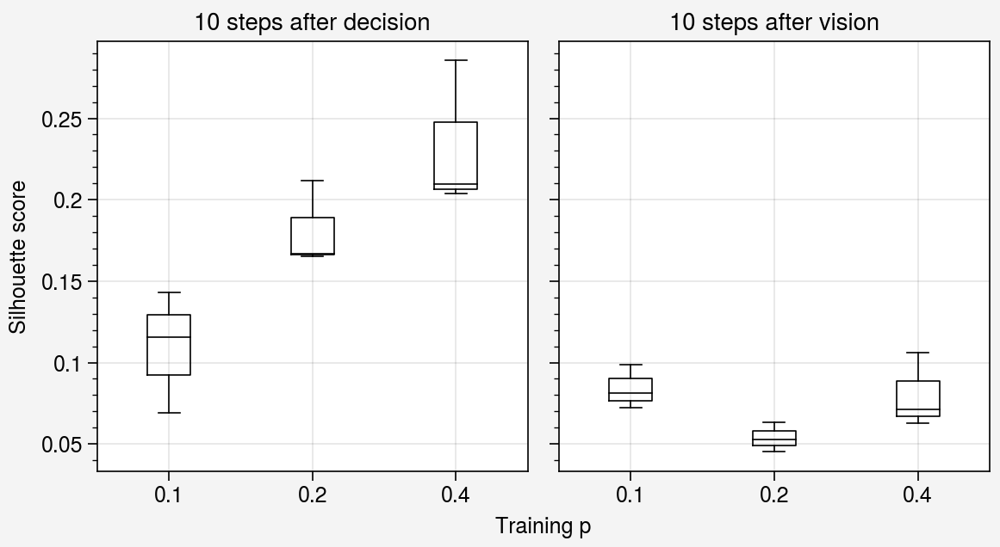

In [94]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']
n_steps = 10
decision_scores = []
for p in probs:
    scores = []
    for t in range(3):
        key = f'{p}_{t}'
        activ2d = all_activ2ds[key][-1]['activ2d']
        color = decision_coloring(vis, shortcut_used, n_steps)
        score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
        scores.append(score)
    decision_scores.append(scores)
        
vision_scores = []
for p in probs:
    scores = []
    for t in range(3):
        key = f'{p}_{t}'
        activ2d = all_activ2ds[key][-1]['activ2d']
        color = decision_coloring(vis, shortcut_avail, n_steps)
        score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
        scores.append(score)
    vision_scores.append(scores)
    
fig, ax = pplt.subplots(ncols=2)
ax[0].boxplot(np.array(decision_scores).T)
ax[1].boxplot(np.array(vision_scores).T)

ax.format(xlocator=range(3), xformatter=[str(p) for p in probs],
         xlabel='Training p', ylabel='Silhouette score',
         title=['10 steps after decision', '10 steps after vision'])

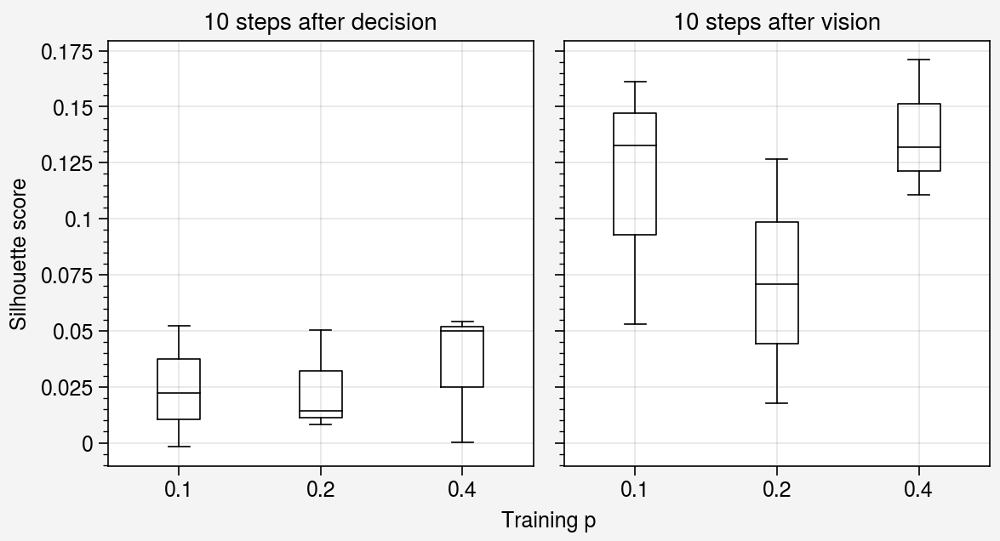

In [97]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc1.5_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']
n_steps = 10
decision_scores = []
for p in probs:
    scores = []
    for t in range(3):
        key = f'{p}_{t}'
        activ2d = all_activ2ds[key][-1]['activ2d']
        color = decision_coloring(vis, shortcut_used, n_steps)
        score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
        scores.append(score)
    decision_scores.append(scores)
        
vision_scores = []
for p in probs:
    scores = []
    for t in range(3):
        key = f'{p}_{t}'
        activ2d = all_activ2ds[key][-1]['activ2d']
        color = decision_coloring(vis, shortcut_avail, n_steps)
        score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
        scores.append(score)
    vision_scores.append(scores)
    
fig, ax = pplt.subplots(ncols=2)
ax[0].boxplot(np.array(decision_scores).T)
ax[1].boxplot(np.array(vision_scores).T)

ax.format(xlocator=range(3), xformatter=[str(p) for p in probs],
         xlabel='Training p', ylabel='Silhouette score',
         title=['10 steps after decision', '10 steps after vision'])

### Boxplots wrt increasing steps after seeing shortcut

Very clear increase in separation over time with wc4, but with wc1.5 separation occurs when seeing the shortcut, and less so afterwards. 

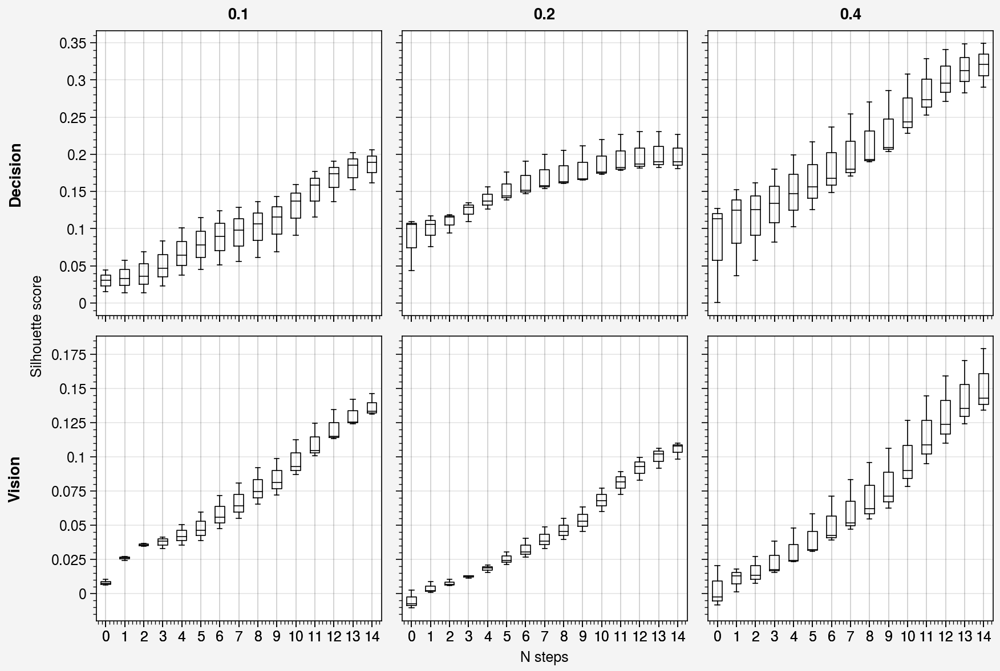

In [103]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
decision_scores = []
for p in probs:
    n_scores = []
    for n in ns:
        scores = []
        for t in range(3):
            key = f'{p}_{t}'
            activ2d = all_activ2ds[key][-1]['activ2d']
            color = decision_coloring(vis, shortcut_used, n)
            score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
            scores.append(score)
        n_scores.append(scores)
    decision_scores.append(n_scores)
        
vision_scores = []
for p in probs:
    n_scores = []
    for n in ns:
        scores = []
        for t in range(3):
            key = f'{p}_{t}'
            activ2d = all_activ2ds[key][-1]['activ2d']
            color = decision_coloring(vis, shortcut_avail, n)
            score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
            scores.append(score)
        n_scores.append(scores)
    vision_scores.append(n_scores)
    
fig, ax = pplt.subplots(nrows=2, ncols=3)

for i, p in enumerate(probs):
    ax[0, i].boxplot(np.array(decision_scores[i]).T)
    ax[1, i].boxplot(np.array(vision_scores[i]).T)
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=['Decision', 'Vision'])

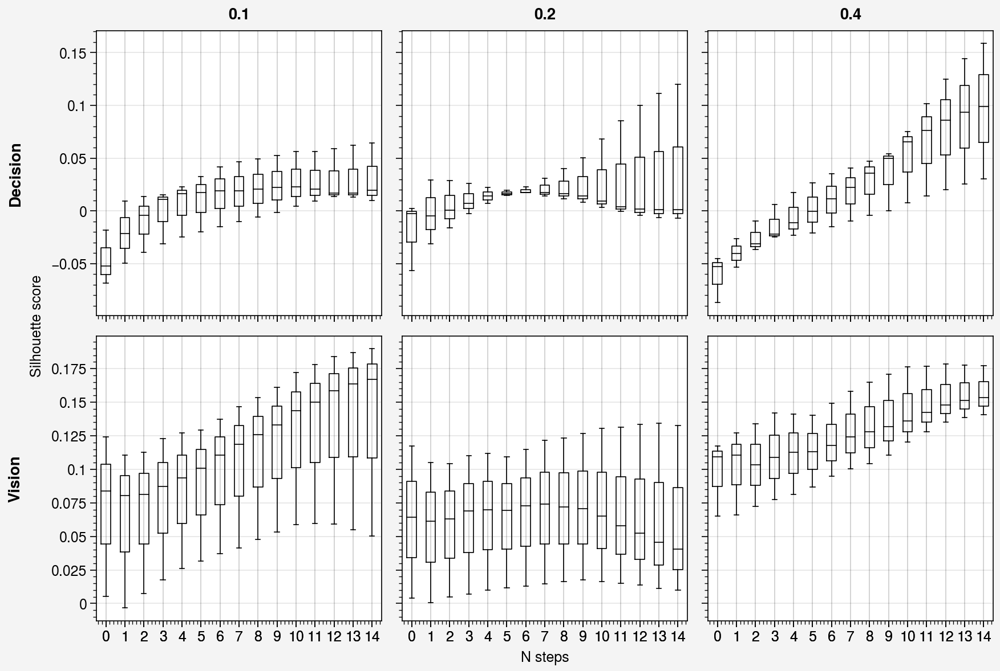

In [102]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc1.5_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
decision_scores = []
for p in probs:
    n_scores = []
    for n in ns:
        scores = []
        for t in range(3):
            key = f'{p}_{t}'
            activ2d = all_activ2ds[key][-1]['activ2d']
            color = decision_coloring(vis, shortcut_used, n)
            score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
            scores.append(score)
        n_scores.append(scores)
    decision_scores.append(n_scores)
        
vision_scores = []
for p in probs:
    n_scores = []
    for n in ns:
        scores = []
        for t in range(3):
            key = f'{p}_{t}'
            activ2d = all_activ2ds[key][-1]['activ2d']
            color = decision_coloring(vis, shortcut_avail, n)
            score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
            scores.append(score)
        n_scores.append(scores)
    vision_scores.append(n_scores)
    
fig, ax = pplt.subplots(nrows=2, ncols=3)

for i, p in enumerate(probs):
    ax[0, i].boxplot(np.array(decision_scores[i]).T)
    ax[1, i].boxplot(np.array(vision_scores[i]).T)
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=['Decision', 'Vision'])

#### Increasing steps after seeing shortcut, with shortcut always open

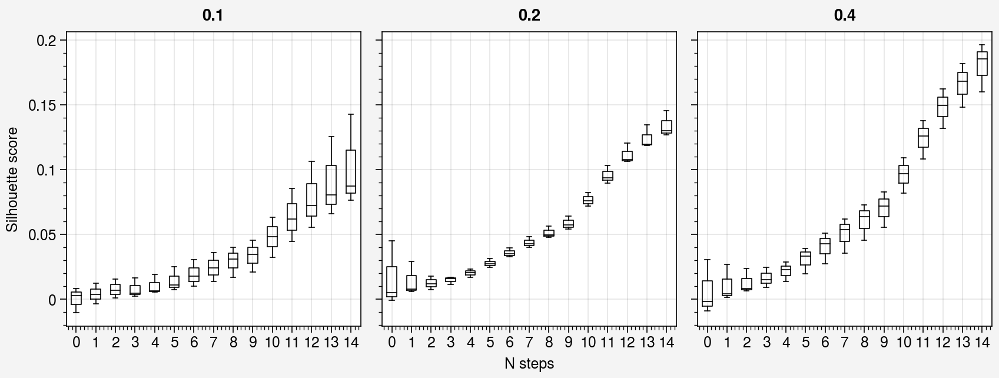

In [106]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
decision_scores = []
for p in probs:
    n_scores = []
    for n in ns:
        scores = []
        for t in range(3):
            key = f'{p}_{t}'
            activ2d = all_activ2ds[key][-1]['activ2d']
            color = decision_coloring(vis, shortcut_used, n)
            score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
            scores.append(score)
        n_scores.append(scores)
    decision_scores.append(n_scores)
    
fig, ax = pplt.subplots(nrows=1, ncols=3)

for i, p in enumerate(probs):
    ax[i].boxplot(np.array(decision_scores[i]).T)
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs])

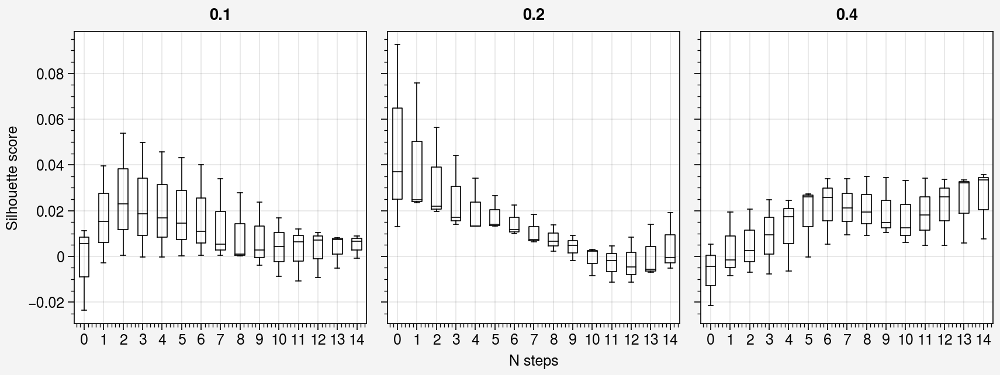

In [105]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
decision_scores = []
for p in probs:
    n_scores = []
    for n in ns:
        scores = []
        for t in range(3):
            key = f'{p}_{t}'
            activ2d = all_activ2ds[key][-1]['activ2d']
            color = decision_coloring(vis, shortcut_used, n)
            score = two_set_silhouette_score(activ2d[color==0], activ2d[color==1])
            scores.append(score)
        n_scores.append(scores)
    decision_scores.append(n_scores)
    
fig, ax = pplt.subplots(nrows=1, ncols=3)

for i, p in enumerate(probs):
    ax[i].boxplot(np.array(decision_scores[i]).T)
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs])

### Boxplots wrt increasing steps, split into none, seen, and used

In [177]:
all_activ2ds[key][-1]['activ']

tensor([[-0.0411, -0.0759, -0.0560,  ...,  0.8584, -0.1454,  0.6963],
        [-0.0842, -0.1074, -0.1777,  ...,  0.9590, -0.5093,  0.7153],
        [-0.1774, -0.1570, -0.3660,  ...,  0.9814, -0.7402,  0.7134],
        ...,
        [ 0.5098,  0.4443,  0.9253,  ...,  0.7290,  0.9609,  0.3083],
        [ 0.7437,  0.6133,  0.9248,  ...,  0.7036,  0.9634,  0.1946],
        [ 0.9072,  0.7490,  0.9248,  ...,  0.6758,  0.9658,  0.0591]],
       dtype=torch.float16)

In [184]:
all_scores['none_vs_vis'][0]

[[-0.013111971846386988, 0.0022239333761759844, -0.007175470647260338],
 [0.0003315166962159131, 0.021406878412876914, 0.010172428380136876],
 [0.008496124000009741, 0.028295889570933982, 0.018155850190952824],
 [0.011917890588544013, 0.026237908116026366, 0.018615308460702144],
 [0.01600839516994929, 0.026570109417381214, 0.021511096218414776],
 [0.017267520074319618, 0.02585402034592025, 0.022772124376114908],
 [0.0208868225364487, 0.02793216410234057, 0.02674990675435306],
 [0.022027869025078223, 0.02843198495488722, 0.02845475442233328],
 [0.024322279024860286, 0.03031639477373157, 0.032271797648830286],
 [0.0229807289083714, 0.028612744463296855, 0.03182800459239175],
 [0.02128682176940943, 0.02660280187693798, 0.03029209041396838],
 [0.022361183338706552, 0.02705453475837901, 0.030604002742859904],
 [0.023990972197092182, 0.028929528624789744, 0.031173909651634454],
 [0.02544613862456901, 0.030629141125887646, 0.03182472848876485],
 [0.027021048515764215, 0.032888280457681274, 0.

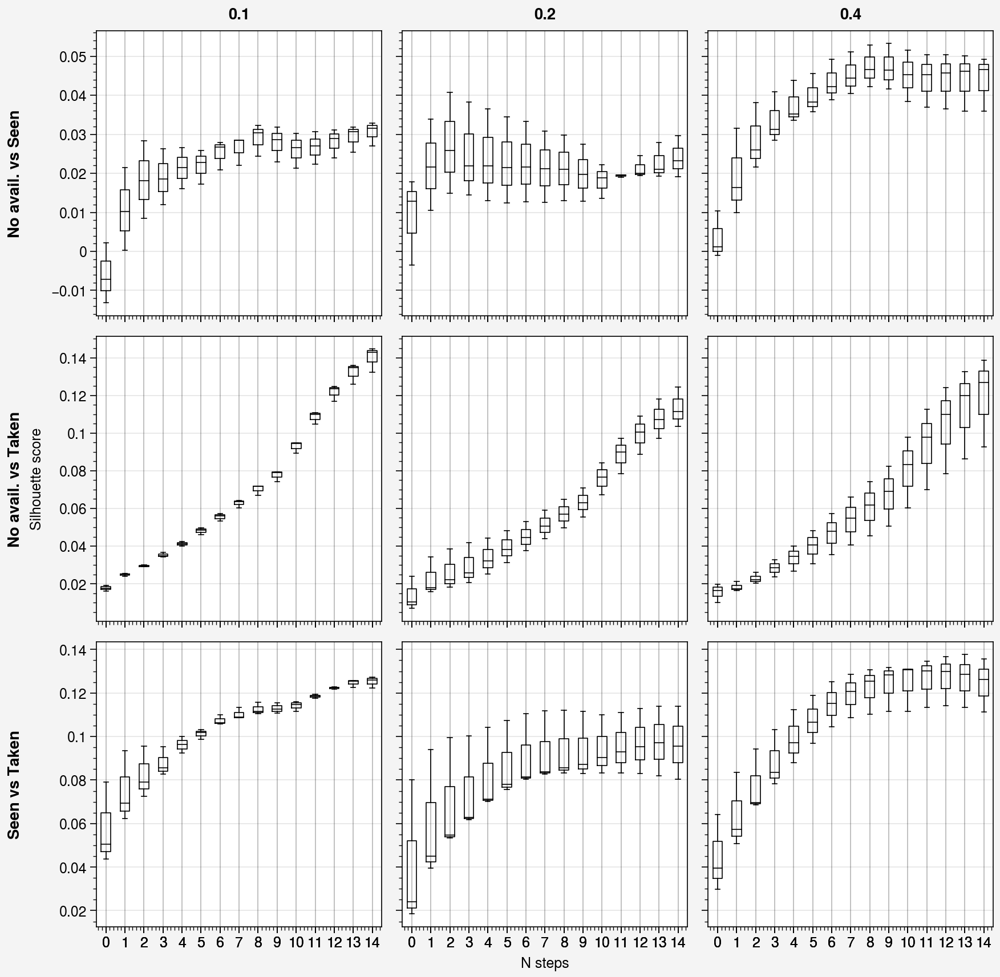

In [186]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc4_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for n in ns:
        scores1 = []
        scores2 = []
        scores3 = []
        
        for t in range(3):
            key = f'{p}_{t}'
            activ = all_activ2ds[key][-1]['activ']
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n)
            score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
            score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
            score3 = two_set_silhouette_score(activ[color==0], activ[color==2])
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=3, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].boxplot(np.array(all_scores[key][j]).T)
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels)

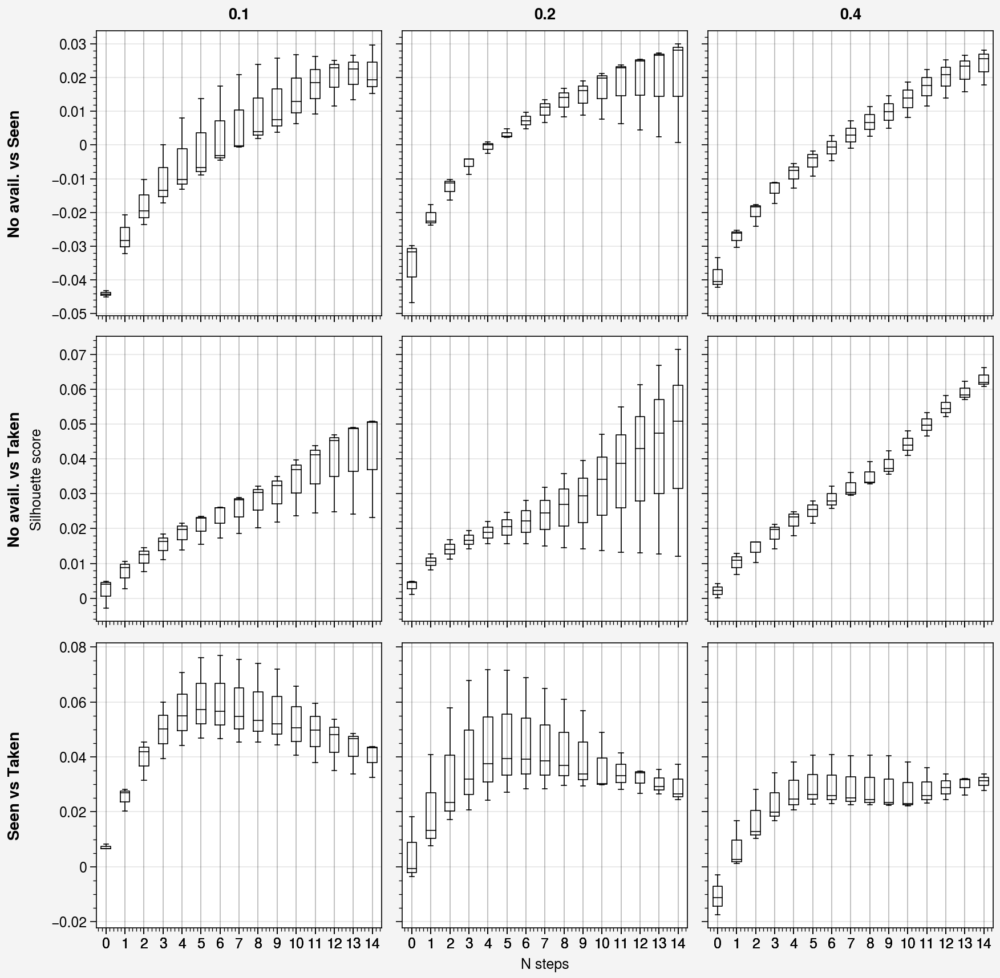

In [187]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_copied/activ2ds', 'rb'))
all_activ2ds2 = pickle.load(open('data/shortcut/wc1.5_copied2/activ2ds', 'rb'))

vis = all_activ2ds['vis']
shortcut_avail = all_activ2ds['shortcut']
shortcut_used = all_activ2ds['shortcut_used']

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for n in ns:
        scores1 = []
        scores2 = []
        scores3 = []
        
        for t in range(3):
            key = f'{p}_{t}'
            activ = all_activ2ds[key][-1]['activ']
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n)
            score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
            score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
            score3 = two_set_silhouette_score(activ[color==0], activ[color==2])
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=3, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].boxplot(np.array(all_scores[key][j]).T)
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels)

#### Policy

In [188]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_policy/activ2ds', 'rb'))
key = '0.4_0'


In [216]:
res = comb_policy_res(shortcut_res, 21, get_activ=True)

In [219]:
res.keys()

dict_keys(['color', 'ep_pos', 'vis', 'shortcut_avail', 'shortcut_used', 'activ2d', 'activ'])

In [221]:
res['activ'].shape

torch.Size([4517, 64])

In [224]:
np.concatenate(res['ep_pos']).shape

(4517, 2)

In [193]:
shortcut_res = pickle.load(open('data/shortcut/wc4_policy/0.4_0', 'rb'))

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.26s/it]


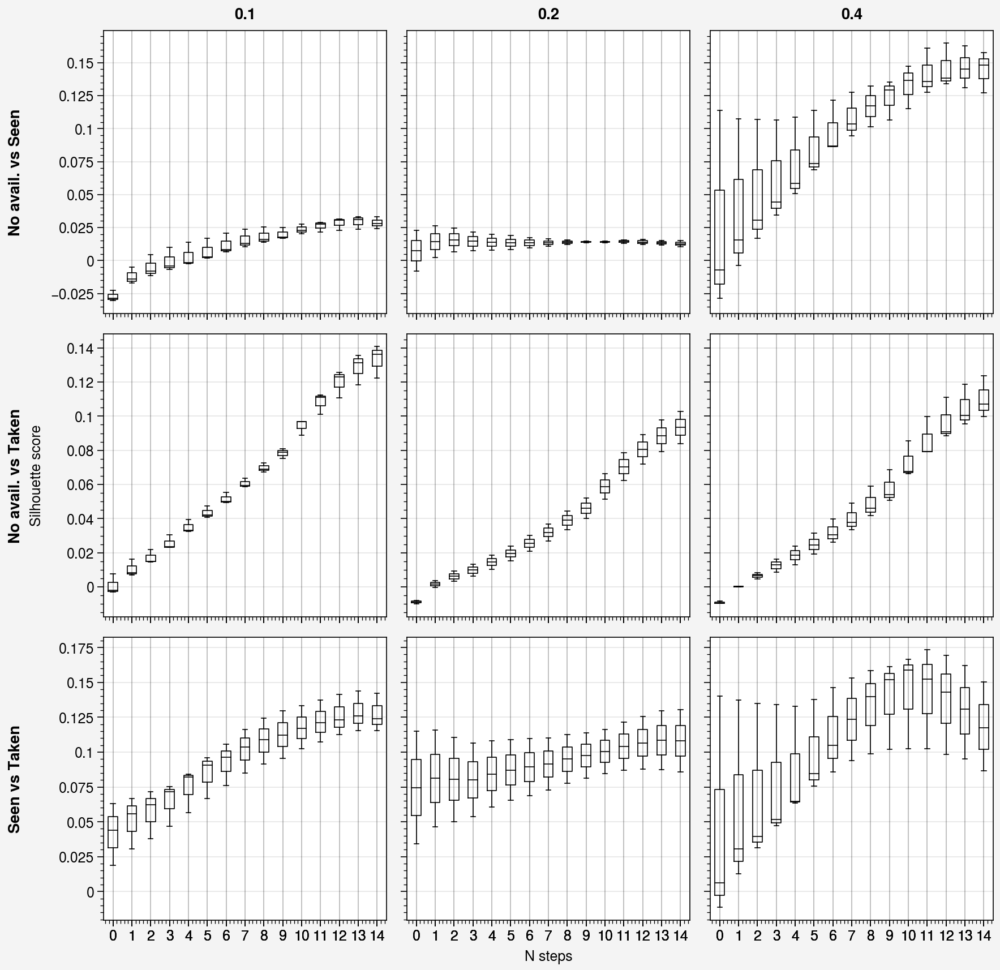

In [238]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_policy/activ2ds', 'rb'))

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for t in tqdm(range(3)):
        if p == 0.2 and t == 2:
            continue
        key = f'{p}_{t}'
        shortcut_res = pickle.load(open(f'data/shortcut/wc4_policy/{key}', 'rb'))

        scores1 = []
        scores2 = []
        scores3 = []
        for n in ns:
            res = comb_policy_res(shortcut_res, 21, vis_n=n, get_activ=True)
            
            activ = res['activ']
            vis = res['vis']
            shortcut_avail = res['shortcut_avail']
            shortcut_used = res['shortcut_used']
            
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n)
            score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
            score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
            score3 = two_set_silhouette_score(activ[color==0], activ[color==2])
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=3, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].boxplot(np.array(all_scores[key][j]))
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels)

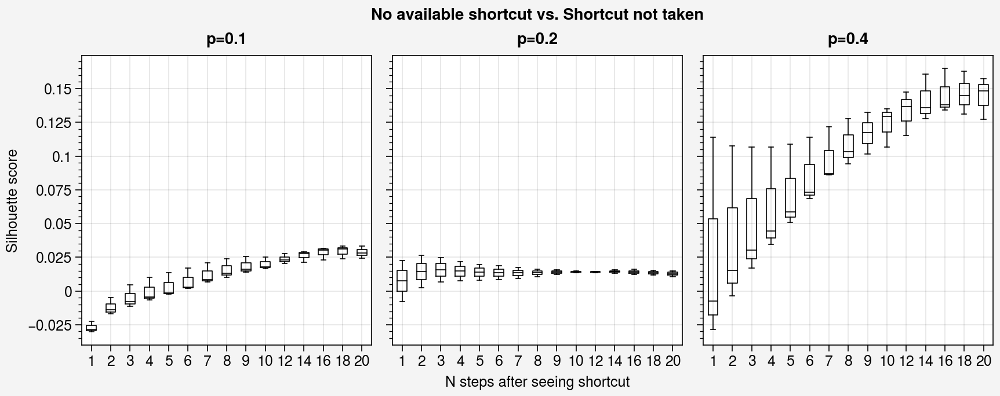

In [ ]:
fig, ax = pplt.subplots(nrows=1, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
key = 'none_vs_vis'
for j, p in enumerate(probs):
    ax[j].boxplot(np.array(all_scores[key][j]))
        
ax.format(xlabel='N steps after seeing shortcut', ylabel='Silhouette score',
         toplabels=[f'p={p}' for p in probs],
         xformatter=[str(n) for n in ns], xlocator=range(len(ns)),
         suptitle='No available shortcut vs. Shortcut not taken')

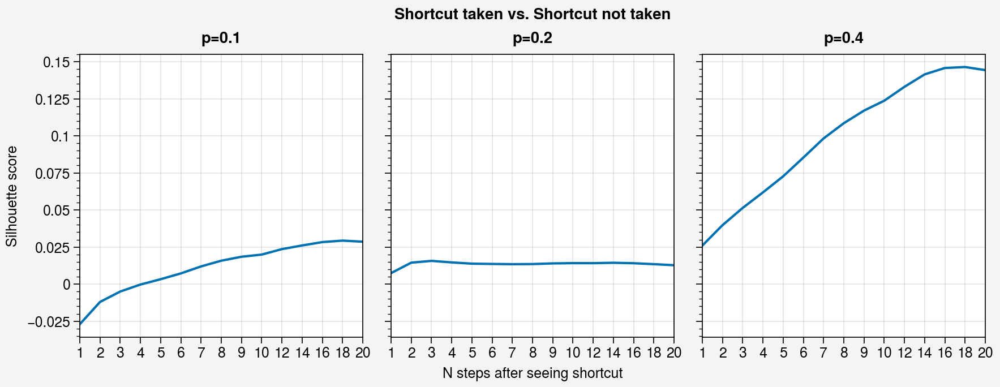

In [252]:
fig, ax = pplt.subplots(nrows=1, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
key = 'none_vs_vis'
for j, p in enumerate(probs):
    ax[j].plot(np.array(all_scores[key][j]).mean(axis=0))
        
ax.format(xlabel='N steps after seeing shortcut', ylabel='Silhouette score',
         toplabels=[f'p={p}' for p in probs],
         xformatter=[str(n) for n in ns], xlocator=range(len(ns)),
         suptitle='Shortcut taken vs. Shortcut not taken')

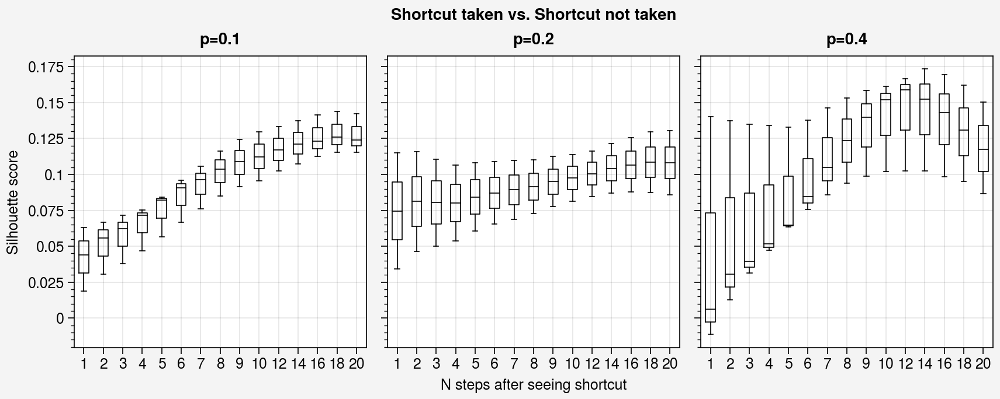

In [245]:
fig, ax = pplt.subplots(nrows=1, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
key = 'vis_vs_taken'
for j, p in enumerate(probs):
    ax[j].boxplot(np.array(all_scores[key][j]))
        
ax.format(xlabel='N steps after seeing shortcut', ylabel='Silhouette score',
         toplabels=[f'p={p}' for p in probs],
         xformatter=[str(n) for n in ns], xlocator=range(len(ns)),
         suptitle='Shortcut taken vs. Shortcut not taken')

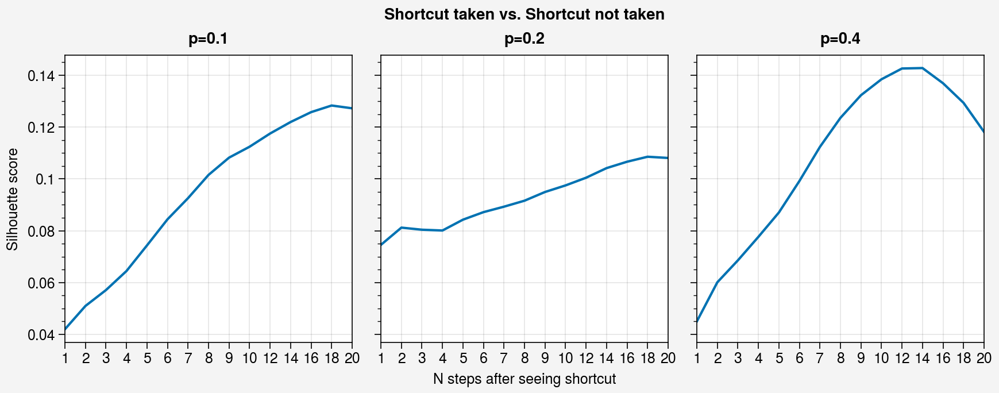

In [251]:
fig, ax = pplt.subplots(nrows=1, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
key = 'vis_vs_taken'
for j, p in enumerate(probs):
    ax[j].plot(np.array(all_scores[key][j]).mean(axis=0))
        
ax.format(xlabel='N steps after seeing shortcut', ylabel='Silhouette score',
         toplabels=[f'p={p}' for p in probs],
         xformatter=[str(n) for n in ns], xlocator=range(len(ns)),
         suptitle='Shortcut taken vs. Shortcut not taken')

In [ ]:
fig, ax = pplt.subplots(nrows=3, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].boxplot(np.array(all_scores[key][j]))
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels)

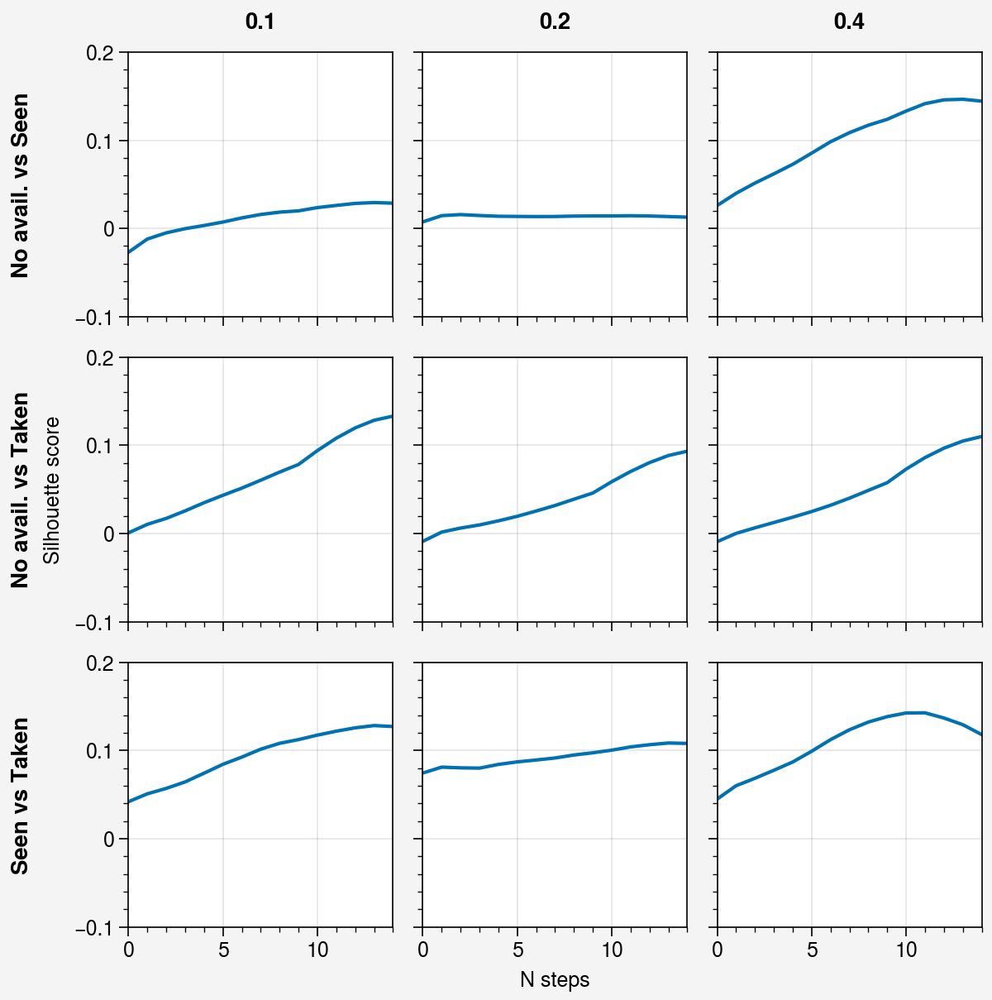

In [254]:
fig, ax = pplt.subplots(nrows=3, ncols=3, figwidth=6)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].plot(np.array(all_scores[key][j]).mean(axis=0))
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels, ylim=[-0.1, 0.2])

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:14<00:00,  4.78s/it]


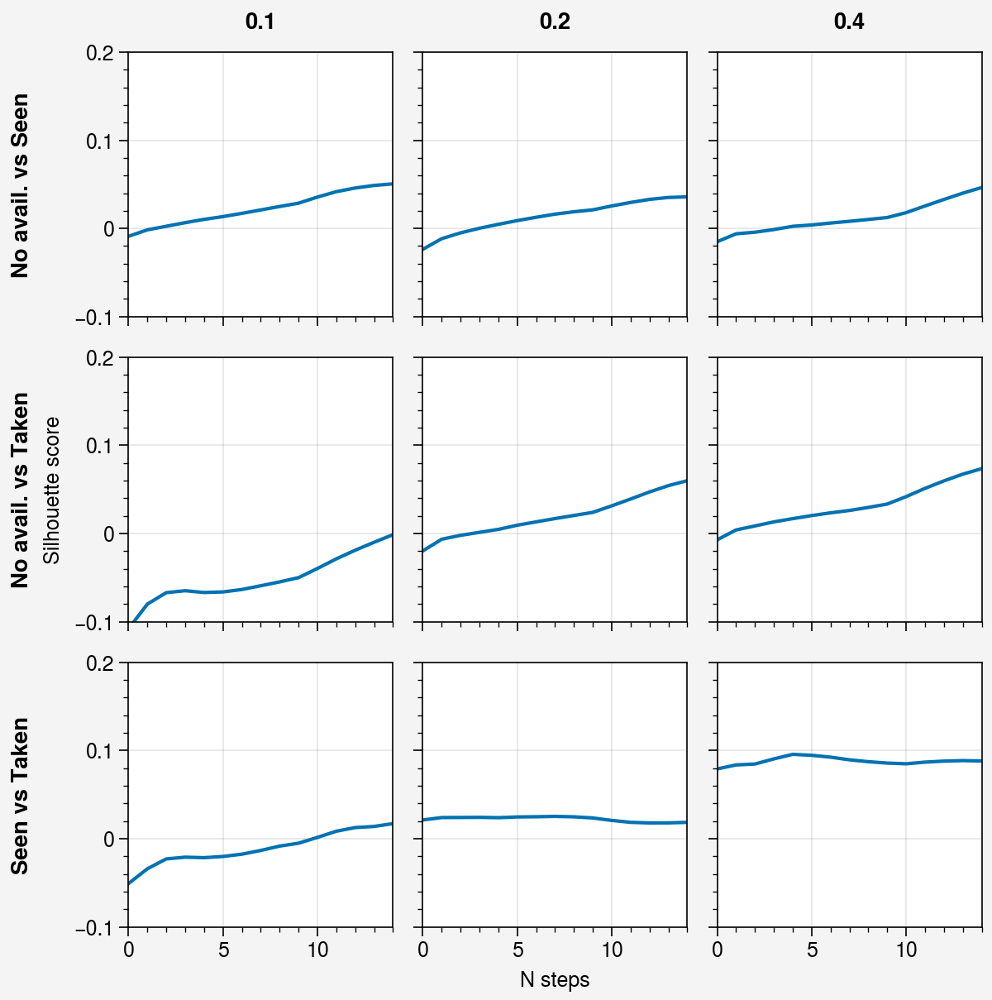

In [255]:
all_activ2ds = pickle.load(open('data/shortcut/wc1.5_policy/activ2ds', 'rb'))

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for t in tqdm(range(3)):
        if p == 0.2 and t == 2:
            continue
        key = f'{p}_{t}'
        shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_policy/{key}', 'rb'))

        scores1 = []
        scores2 = []
        scores3 = []
        for n in ns:
            res = comb_policy_res(shortcut_res, 21, vis_n=n, get_activ=True)
            
            activ = res['activ']
            vis = res['vis']
            shortcut_avail = res['shortcut_avail']
            shortcut_used = res['shortcut_used']
            
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n)
            score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
            score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
            score3 = two_set_silhouette_score(activ[color==0], activ[color==2])
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=3, ncols=3, figwidth=6)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].plot(np.array(all_scores[key][j]).mean(axis=0))
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels, ylim=[-0.1, 0.2])

#### Actor 1 layer

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:13<00:00,  4.52s/it]


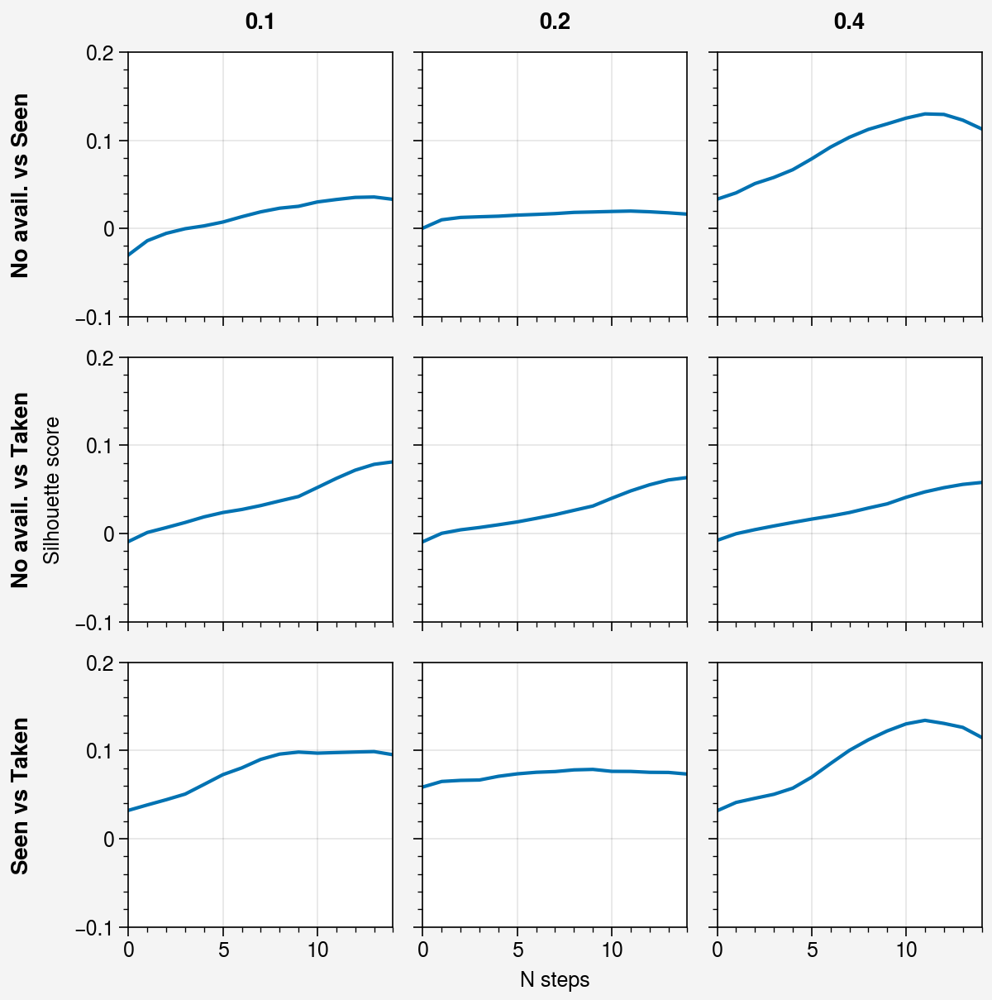

In [257]:
ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for t in tqdm(range(3)):
        if p == 0.2 and t == 2:
            continue
        key = f'{p}_{t}'
        shortcut_res = pickle.load(open(f'data/shortcut/wc4_policy/{key}', 'rb'))

        scores1 = []
        scores2 = []
        scores3 = []
        for n in ns:
            res = comb_policy_res(shortcut_res, 21, vis_n=n, get_activ=True,
                                 activ_type='actor_activations', activ_layer=0)
            
            activ = res['activ']
            vis = res['vis']
            shortcut_avail = res['shortcut_avail']
            shortcut_used = res['shortcut_used']
            
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n)
            score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
            score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
            score3 = two_set_silhouette_score(activ[color==0], activ[color==2])
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=3, ncols=3, figwidth=6)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].plot(np.array(all_scores[key][j]).mean(axis=0))
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels, ylim=[-0.1, 0.2])

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.05s/it]


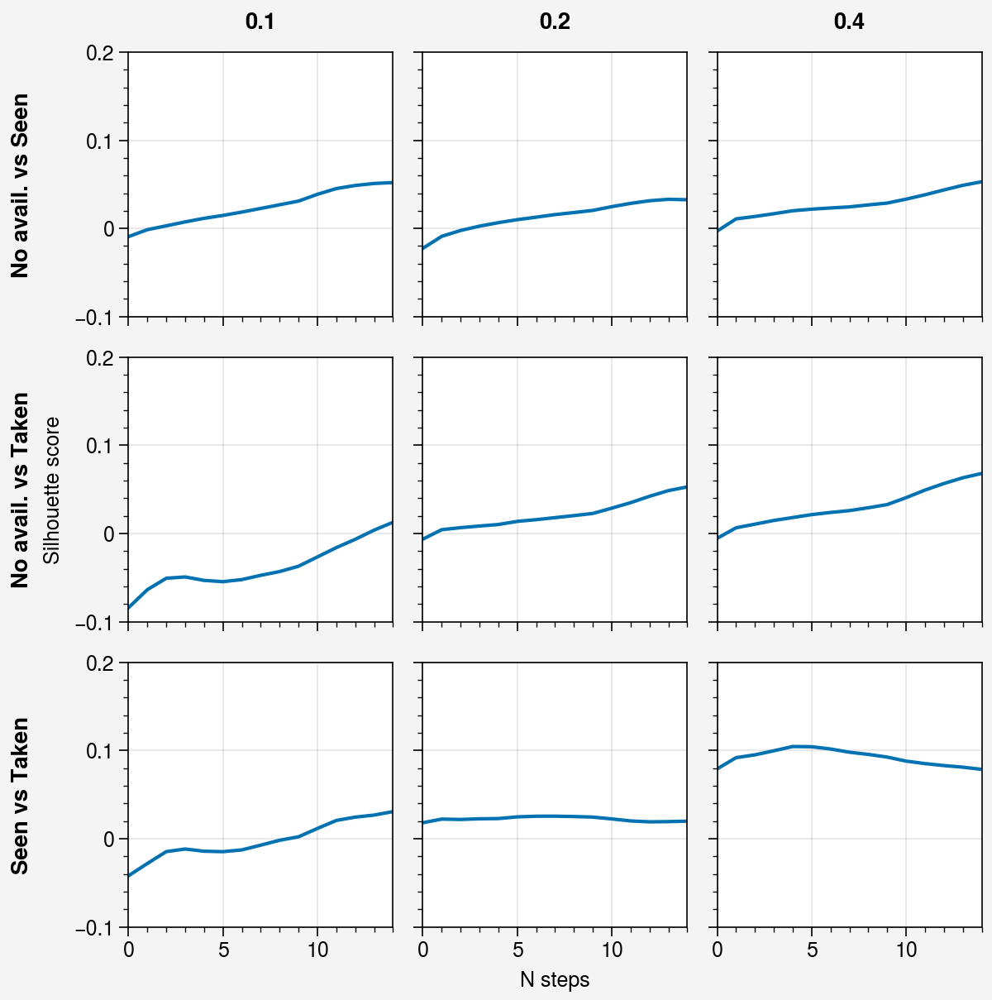

In [259]:
ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for t in tqdm(range(3)):
        if p == 0.2 and t == 2:
            continue
        key = f'{p}_{t}'
        shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_policy/{key}', 'rb'))

        scores1 = []
        scores2 = []
        scores3 = []
        for n in ns:
            res = comb_policy_res(shortcut_res, 21, vis_n=n, get_activ=True,
                                 activ_type='actor_activations', activ_layer=0)
            
            activ = res['activ']
            vis = res['vis']
            shortcut_avail = res['shortcut_avail']
            shortcut_used = res['shortcut_used']
            
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n)
            score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
            score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
            score3 = two_set_silhouette_score(activ[color==0], activ[color==2])
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=3, ncols=3, figwidth=6)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].plot(np.array(all_scores[key][j]).mean(axis=0))
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels, ylim=[-0.1, 0.2])

## Decision vs. Vision boxplots - 10 agents



### wc1.5 Policy

In [9]:
activs = pickle.load(open('data/shortcut/wc1.5_policy_moreagents/shared1_activ', 'rb'))


In [12]:
activs['0.4_0'][-1].keys()

dict_keys(['pos', 'vis', 'shortcut_avail', 'shortcut_used', 'activ'])

In [43]:
[np.sum(activs[f'0.1_{t}'][-1]['shortcut_used']) for t in range(10)]

[7, 2, 1, 6, 5, 0, 9, 1, 0, 0]

In [44]:
# only consider agents that used shortcut at least 5 times

probs = [0.1, 0.4]
trials = range(10)
ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]

for p, t in itertools.product(probs, trials):
    key = f'{p}_{t}'
    shortcut_res = activs[key]
    res = shortcut_res[-1]
    
    vis, avail, used, activ = res['vis'], res['shortcut_avail'], res['shortcut_used'], res['activ']
    
    if np.sum(used) == 0:
        continue
        
    colors = vision_decision_coloring(vis, avail, used)
    
    

In [ ]:
fig, ax = pplt.subplots(ncols=5)
shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/64_0.4_0', 'rb'))

for i in tqdm(range(5)):
    res2 = shortcut_res[i*5+1]
    activs = res2['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.35).fit_transform(activs)
    ax[i].scatter(activ2d[:, 0], activ2d[:, 1], alpha=0.1)

In [ ]:
fig, ax = pplt.subplots(ncols=5)
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.4_0', 'rb'))

for i in tqdm(range(5)):
    res2 = shortcut_res[i*5+1]
    activs = res2['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.35).fit_transform(activs)
    ax[i].scatter(activ2d[:, 0], activ2d[:, 1], alpha=0.1)

In [ ]:
fig, ax = pplt.subplots(ncols=5)
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.4_0', 'rb'))

for i in tqdm(range(5)):
    res2 = shortcut_res[i*5+1]
    activ2d = res2['activ2d']
    ax[i].scatter(activ2d[:, 0], activ2d[:, 1], alpha=0.1)

100%|██████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:01<00:00,  2.93it/s]


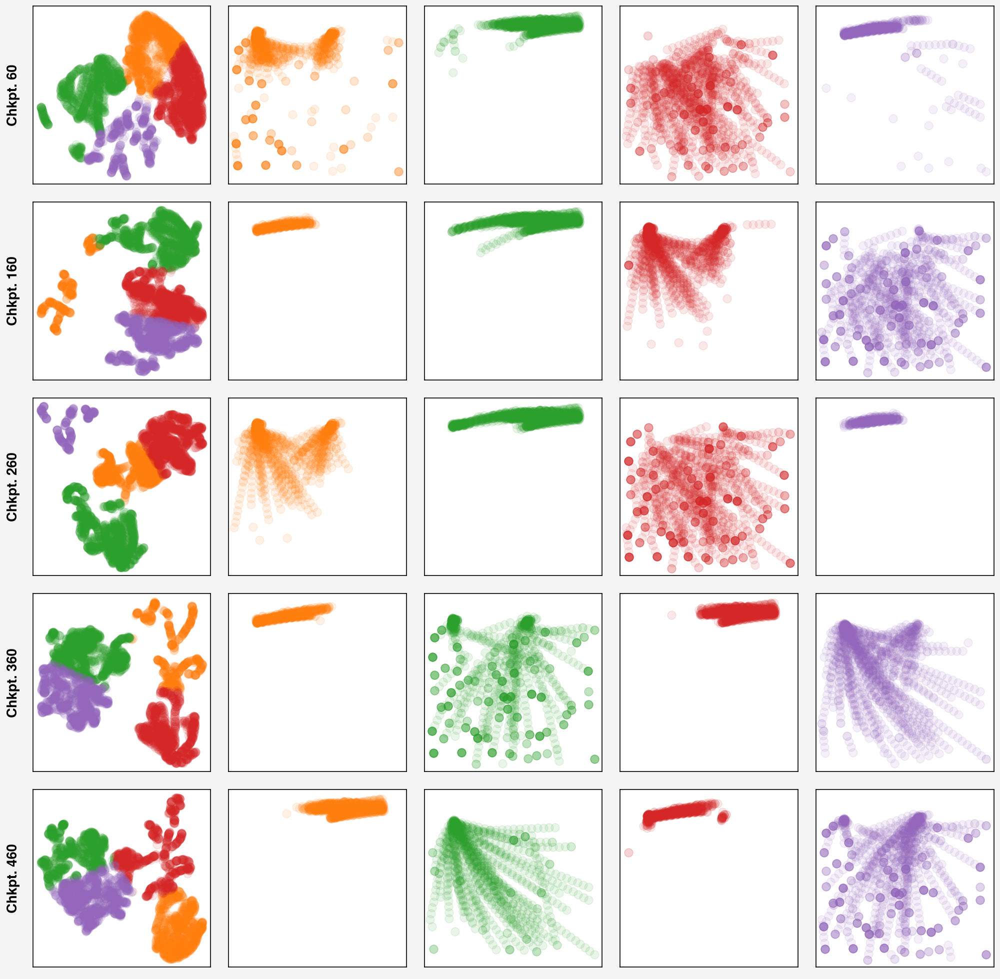

In [425]:
fig, ax = pplt.subplots(ncols=5, nrows=5, sharey=False, sharex=False, figwidth=10)
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.4_0', 'rb'))

leftlabels = []
# activ2ds = []
for i in tqdm(range(5)):
    res2 = shortcut_res[i*5+1]
    pos = res2['pos']
    leftlabels.append(f'Chkpt. {chks[i*5+1]}')
    # activs = res2['activs']['shared_activations'][1]
    # activ2d = UMAP(min_dist=0.35).fit_transform(activs)
    # activ2ds.append(activ2d)
    activ2d = activ2ds[i]
    labels = KMeans(n_clusters=4).fit_predict(activ2d)
    colored_activ2d_plot(activ2d, labels, pos, ax=ax[i, :])
    
ax.format(xticks=[], yticks=[], leftlabels=leftlabels)

100%|██████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.73s/it]


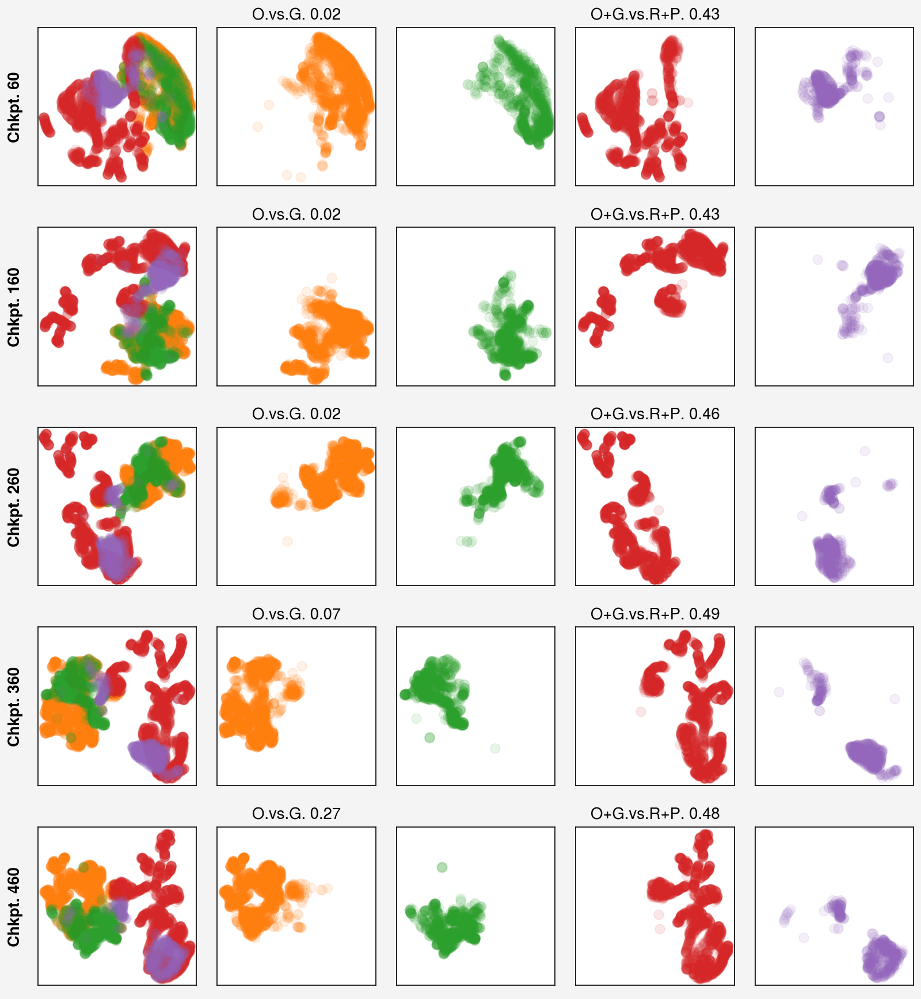

In [421]:
fig, ax = pplt.subplots(ncols=5, nrows=5, sharey=False, sharex=False, figwidth=8)
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.4_0', 'rb'))

leftlabels = []
title = []
for i in tqdm(range(5)):
    res2 = shortcut_res[i*5+1]
    activ2d = activ2ds[i]
    pos = res2['pos']
    labels, no_cluster = decompose_shortcut_trajectories(res2)
    colored_activ2d_plot(activ2d, labels, ax=ax[i, :], split_activ=True)
    
    leftlabels.append(f'Chkpt. {chks[i*5+1]}')
    silscore = two_set_silhouette_score(activ2d[labels==0], activ2d[labels==1])
    title.append('')
    title.append(f'O.vs.G. {silscore:.2f}')
    title.append('')
    silscore = two_set_silhouette_score(
        activ2d[(labels==0) | (labels==1)],
        activ2d[(labels==2) | (labels==3)])
    title.append(f'O+G.vs.R+P. {silscore:.2f}')
    title.append('')
    
    
ax.format(leftlabels=leftlabels,
         xticks=[], yticks=[], title=title)

100%|██████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 14.74it/s]


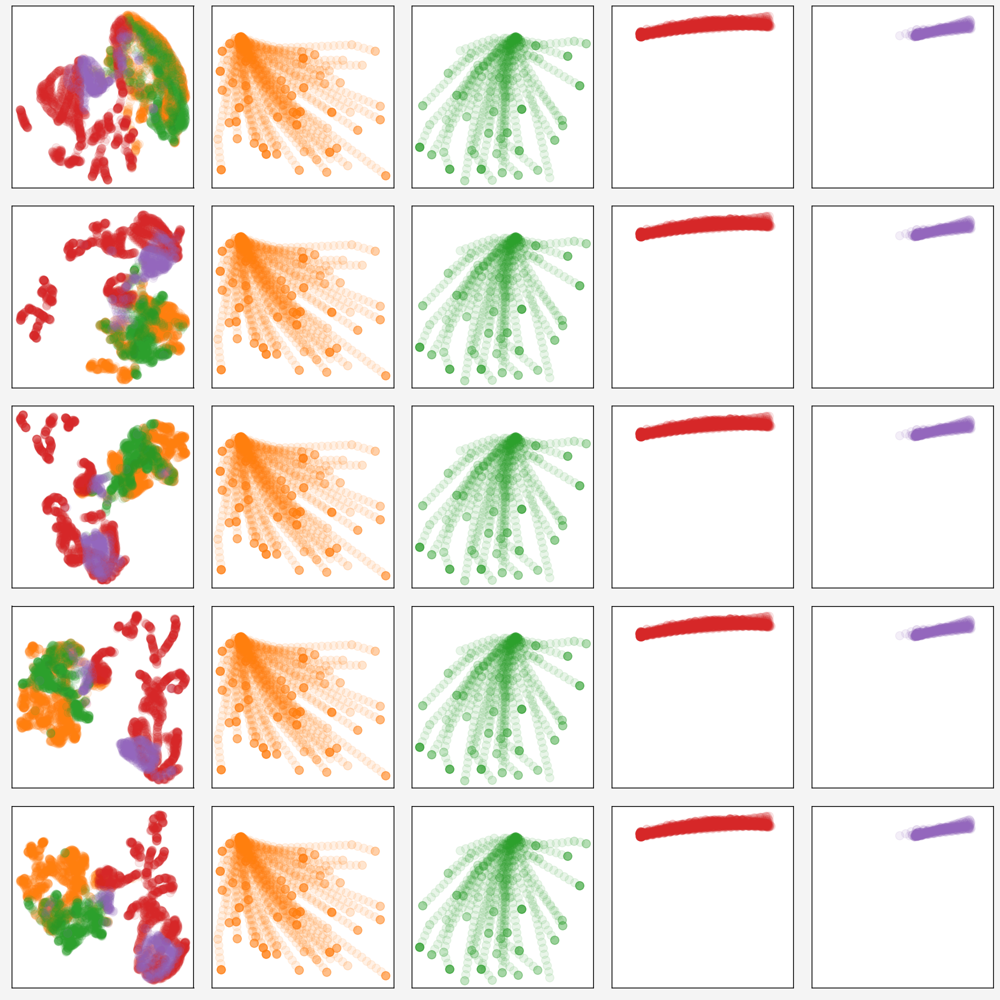

In [422]:
fig, ax = pplt.subplots(ncols=5, nrows=5, sharey=False, sharex=False, figwidth=10)
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.4_0', 'rb'))

for i in tqdm(range(5)):
    res2 = shortcut_res[i*5+1]
    activ2d = activ2ds[i]
    pos = res2['pos']
    labels, no_cluster = decompose_shortcut_trajectories(res2)
    colored_activ2d_plot(activ2d, labels, pos, ax=ax[i, :])
    
ax.format(xticks=[], yticks=[])

100%|██████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.73s/it]


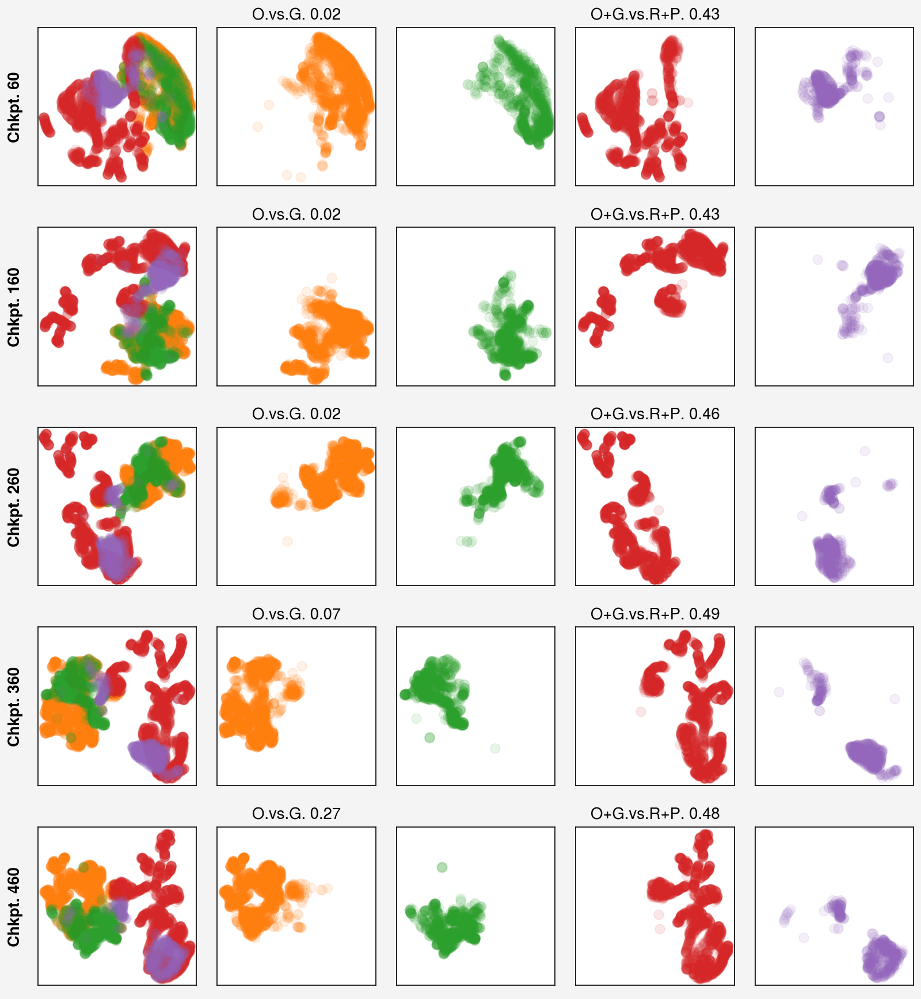

In [421]:
fig, ax = pplt.subplots(ncols=5, nrows=5, sharey=False, sharex=False, figwidth=8)
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/0.4_0', 'rb'))

leftlabels = []
title = []
for i in tqdm(range(5)):
    res2 = shortcut_res[i*5+1]
    activ2d = activ2ds[i]
    pos = res2['pos']
    labels, no_cluster = decompose_shortcut_trajectories(res2)
    colored_activ2d_plot(activ2d, labels, ax=ax[i, :], split_activ=True)
    
    leftlabels.append(f'Chkpt. {chks[i*5+1]}')
    silscore = two_set_silhouette_score(activ2d[labels==0], activ2d[labels==1])
    title.append('')
    title.append(f'O.vs.G. {silscore:.2f}')
    title.append('')
    silscore = two_set_silhouette_score(
        activ2d[(labels==0) | (labels==1)],
        activ2d[(labels==2) | (labels==3)])
    title.append(f'O+G.vs.R+P. {silscore:.2f}')
    title.append('')
    
    
ax.format(leftlabels=leftlabels,
         xticks=[], yticks=[], title=title)

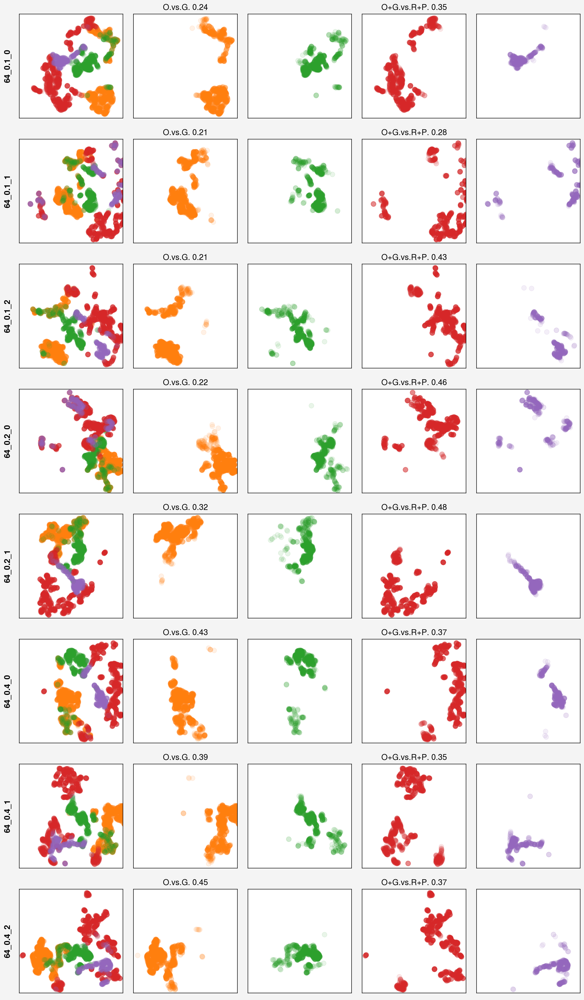

In [433]:
count = 0
leftlabels = []
title = []
activ2ds = []

fig, ax = pplt.subplots(nrows=8, ncols=5, figwidth=10)

pos = res2['pos']
labels, no_cluster = decompose_shortcut_trajectories(res2)

for p, t in itertools.product(probs, range(3)):
    if p == 0.2 and t == 2:
        continue
        
    key = f'64_{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{key}', 'rb'))
    
    res2 = shortcut_res[-1]
    activs = res2['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.35).fit_transform(activs)
    activ2ds.append(activ2d)
    activ2d = activ2ds[count]
    colored_activ2d_plot(activ2d, labels, ax=ax[count, :], split_activ=True)

    leftlabels.append(key)
    silscore = two_set_silhouette_score(activ2d[labels==0], activ2d[labels==1])
    title.append('')
    title.append(f'O.vs.G. {silscore:.2f}')
    title.append('')
    silscore = two_set_silhouette_score(
        activ2d[(labels==0) | (labels==1)],
        activ2d[(labels==2) | (labels==3)])
    title.append(f'O+G.vs.R+P. {silscore:.2f}')
    title.append('')
    count += 1

ax.format(leftlabels=leftlabels,
         xticks=[], yticks=[], title=title)

In [ ]:
count = 0
leftlabels = []
title = []
# activ2ds = []

fig, ax = pplt.subplots(nrows=8, ncols=5, figwidth=10, sharex=False, sharey=False)

pos = res2['pos']
labels, no_cluster = decompose_shortcut_trajectories(res2)

for p, t in itertools.product(probs, range(3)):
    if p == 0.2 and t == 2:
        continue
        
    key = f'{p}_{t}'
    # shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_copied/{key}', 'rb'))
    
    # res2 = shortcut_res[-1]
    # activs = res2['activs']['shared_activations'][1]
    # activ2d = UMAP(min_dist=0.35).fit_transform(activs)
    # activ2ds.append(activ2d)
    activ2d = activ2ds[count]
    labels = KMeans(n_clusters=4).fit_predict(activ2d)
    colored_activ2d_plot(activ2d, labels, pos, ax=ax[count, :])

    leftlabels.append(key)

    count += 1

ax.format(leftlabels=leftlabels,
         xticks=[], yticks=[])

In [ ]:
count = 0
leftlabels = []
title = []
activ2ds = []

fig, ax = pplt.subplots(nrows=8, ncols=5)

for p, t in itertools.product(probs, range(3)):
    if p == 0.2 and t == 2:
        continue
        
    key = f'{p}_{t}'
    shortcut_res = pickle.load(open(f'data/shortcut/wc4_copied/{key}', 'rb'))
    
    res2 = shortcut_res[-1]
    activs = res2['activs']['shared_activations'][1]
    activ2d = UMAP(min_dist=0.35).fit_transform(activs)
    activ2ds.append(activ2d)
    pos = res2['pos']
    labels, no_cluster = decompose_shortcut_trajectories(res2)
    colored_activ2d_plot(activ2d, labels, ax=ax[count, :], split_activ=True)

    leftlabels.append(key)
    silscore = two_set_silhouette_score(activ2d[labels==0], activ2d[labels==1])
    title.append('')
    title.append(f'O.vs.G. {silscore:.2f}')
    title.append('')
    silscore = two_set_silhouette_score(
        activ2d[(labels==0) | (labels==1)],
        activ2d[(labels==2) | (labels==3)])
    title.append(f'O+G.vs.R+P. {silscore:.2f}')
    title.append('')

ax.format(leftlabels=leftlabels,
         xticks=[], yticks=[], title=title)

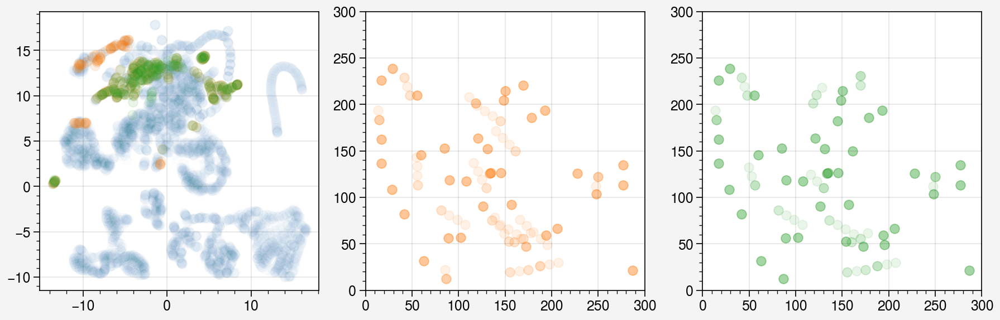

In [252]:
p = 0.1
t = 0
dist_idx = 2
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_policy/{key}', 'rb'))

aidx = list(shortcut_res['activ2d'].keys())[-1]
res1 = shortcut_res['ns'][aidx]
res2 = shortcut_res['ws'][aidx]
activ = shortcut_res['activ2d'][aidx][dist_idx]

vis = res1['vis'][:50] + res2['vis'][:50]
shortcut = res1['shortcut'][:50] + res2['shortcut'][:50]
color = vision_coloring(vis, shortcut)

pos = np.vstack(res1['ep_pos'][:50] + res2['ep_pos'][:50])

fig, ax = pplt.subplots(ncols=3, sharey=False)
idxs = color == -1
ax[0].scatter(activ[idxs, 0], activ[idxs, 1], alpha=0.01, color=rgb_colors[0])
for i in range(2):
    idxs = color == i
    ax[0].scatter(activ[idxs, 0], activ[idxs, 1], alpha=0.1, color=rgb_colors[i+1])
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.1, color=rgb_colors[i+1])
ax[1:].format(xlim=[0,300], ylim=[0,300])

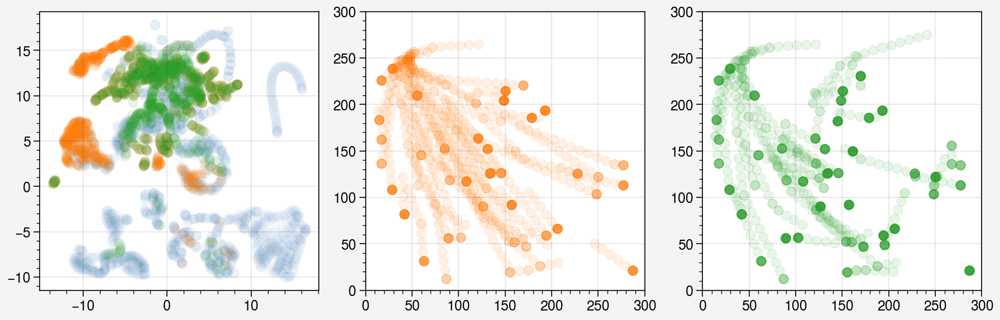

In [253]:
p = 0.1
t = 0
dist_idx = 2
key = f'{p}_{t}'
shortcut_res = pickle.load(open(f'data/shortcut/wc1.5_policy/{key}', 'rb'))

aidx = list(shortcut_res['activ2d'].keys())[-1]
res1 = shortcut_res['ns'][aidx]
res2 = shortcut_res['ws'][aidx]
activ = shortcut_res['activ2d'][aidx][dist_idx]

vis = res1['vis'][:50] + res2['vis'][:50]
shortcut = res1['shortcut'][:50] + res2['shortcut'][:50]
color = vision_coloring(vis, shortcut, 20)

pos = np.vstack(res1['ep_pos'][:50] + res2['ep_pos'][:50])

fig, ax = pplt.subplots(ncols=3, sharey=False)
idxs = color == -1
ax[0].scatter(activ[idxs, 0], activ[idxs, 1], alpha=0.01, color=rgb_colors[0])
for i in range(2):
    idxs = color == i
    ax[0].scatter(activ[idxs, 0], activ[idxs, 1], alpha=0.1, color=rgb_colors[i+1])
    ax[i+1].scatter(pos[idxs, 0], pos[idxs, 1], alpha=0.1, color=rgb_colors[i+1])
ax[1:].format(xlim=[0,300], ylim=[0,300])

# Where is decision made? Sliding population activation windows

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.26s/it]


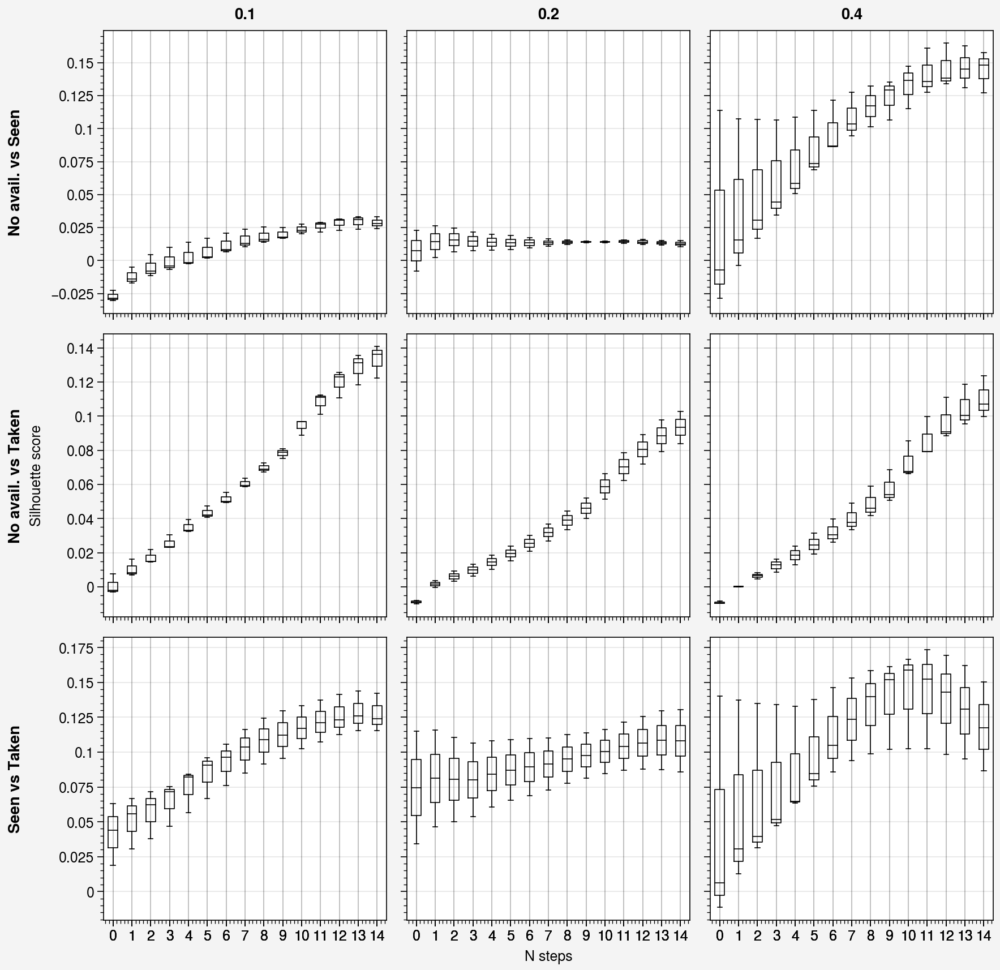

In [238]:
all_activ2ds = pickle.load(open('data/shortcut/wc4_policy/activ2ds', 'rb'))

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for t in tqdm(range(3)):
        if p == 0.2 and t == 2:
            continue
        key = f'{p}_{t}'
        shortcut_res = pickle.load(open(f'data/shortcut/wc4_policy/{key}', 'rb'))

        scores1 = []
        scores2 = []
        scores3 = []
        for n in ns:
            res = comb_policy_res(shortcut_res, 21, vis_n=n, get_activ=True)
            
            activ = res['activ']
            vis = res['vis']
            shortcut_avail = res['shortcut_avail']
            shortcut_used = res['shortcut_used']
            
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n)
            score1 = two_set_silhouette_score(activ[color==0], activ[color==1])
            score2 = two_set_silhouette_score(activ[color==1], activ[color==2])
            score3 = two_set_silhouette_score(activ[color==0], activ[color==2])
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=3, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['No avail. vs Seen', 'No avail. vs Taken', 'Seen vs Taken']
for j, p in enumerate(probs):
    for i, key in enumerate(keys):
        ax[i, j].boxplot(np.array(all_scores[key][j]))
        
ax.format(xlabel='N steps', ylabel='Silhouette score',
         toplabels=[f'{p}' for p in probs],
         leftlabels=leftlabels)

In [2]:
activs = pickle.load(open('data/shortcut/wc1.5_copiedv2_moreagents/shared1_activ', 'rb'))


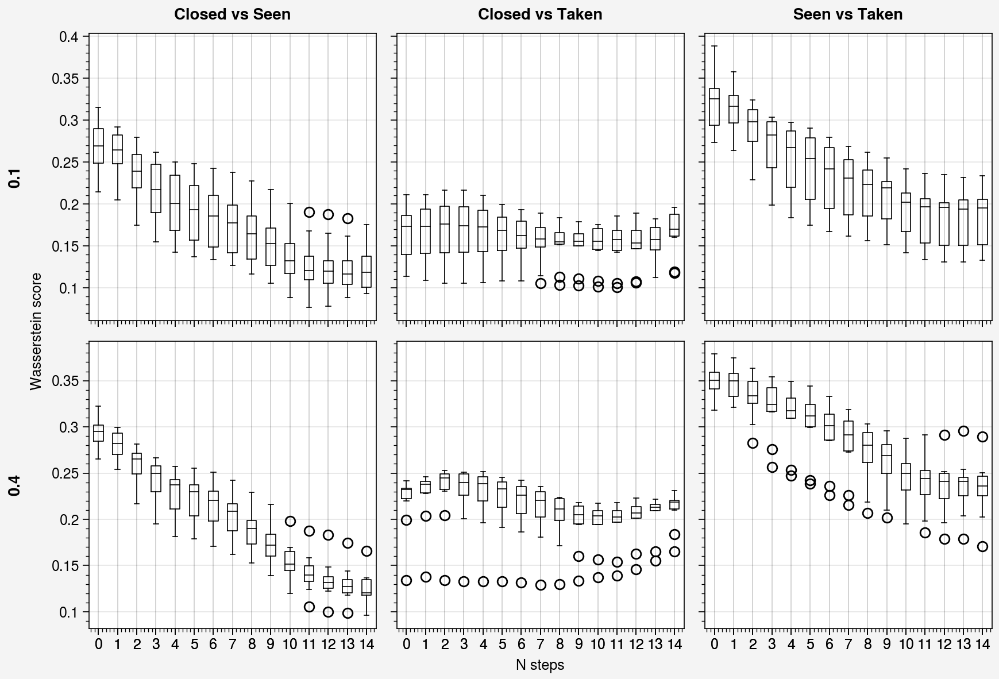

In [16]:
# activs = pickle.load(open('data/shortcut/wc1.5_copiedv2_moreagents/shared1_activ', 'rb'))

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
trials = range(10)
probs = [0.1, 0.4]
chk = 10
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for t in trials:
        key = f'{p}_{t}'
        
        scores1 = []
        scores2 = []
        scores3 = []
        for n in ns:
            
            res = activs[key][chk]
            
            activ = np.vstack(res['activ'])
            vis = res['vis']
            shortcut_avail = res['shortcut_avail']
            shortcut_used = res['shortcut_used']
            
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n+3, n)
            score1 = two_cloud_wasserstein(activ[color==0], activ[color==1], all_data=activ)[0]
            score2 = two_cloud_wasserstein(activ[color==0], activ[color==2], all_data=activ)[0]
            score3 = two_cloud_wasserstein(activ[color==1], activ[color==2], all_data=activ)[0]
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=2, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['Closed vs Seen', 'Closed vs Taken', 'Seen vs Taken']
for i, p in enumerate(probs):
    for j, key in enumerate(keys):
        ax[i, j].boxplot(np.array(all_scores[key][i]))
        
ax.format(xlabel='N steps', ylabel='Wasserstein score',
         leftlabels=[f'{p}' for p in probs],
         toplabels=leftlabels)


In [34]:
trials

range(0, 10)

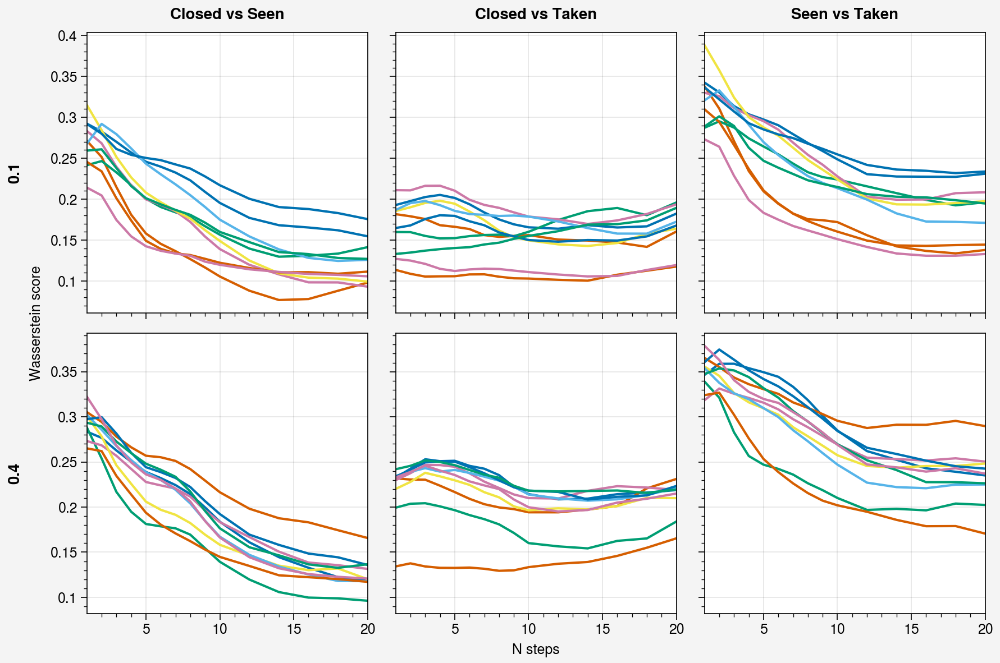

In [35]:
fig, ax = pplt.subplots(nrows=2, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['Closed vs Seen', 'Closed vs Taken', 'Seen vs Taken']
for i, p in enumerate(probs):
    for j, key in enumerate(keys):
        for t in trials:
            ax[i, j].plot(ns, np.array(all_scores[key][i][t]))
        
ax.format(xlabel='N steps', ylabel='Wasserstein score',
         leftlabels=[f'{p}' for p in probs],
         toplabels=leftlabels)


In [21]:
res = activs['0.4_0'][5]

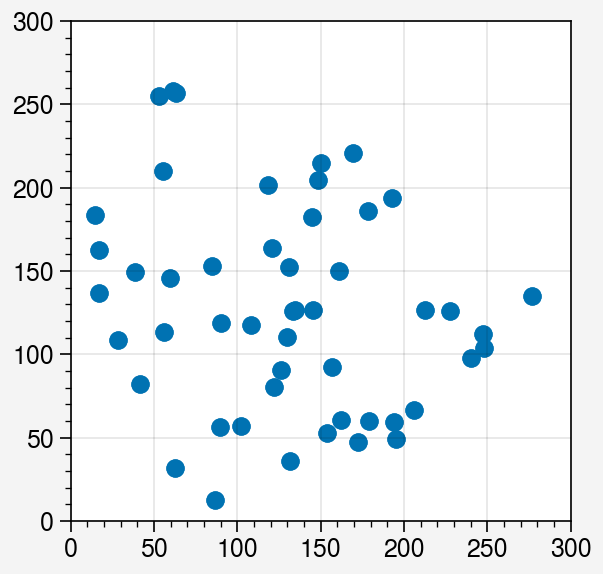

In [37]:
pos = res['pos']
ps = []
for ep, vis in enumerate(res['vis']):
    first_sight = np.argwhere(vis).squeeze()[0]
    p_first = pos[ep][first_sight]
    ps.append(p_first)

ps = np.vstack(ps)
fig, ax = pplt.subplots()
ax.format(xlim=[0, 300], ylim=[0, 300])
ax.scatter(ps[:, 0], ps[:, 1])

In [43]:
keep_eps = np.argwhere(ps[:, 1] > 250).squeeze()

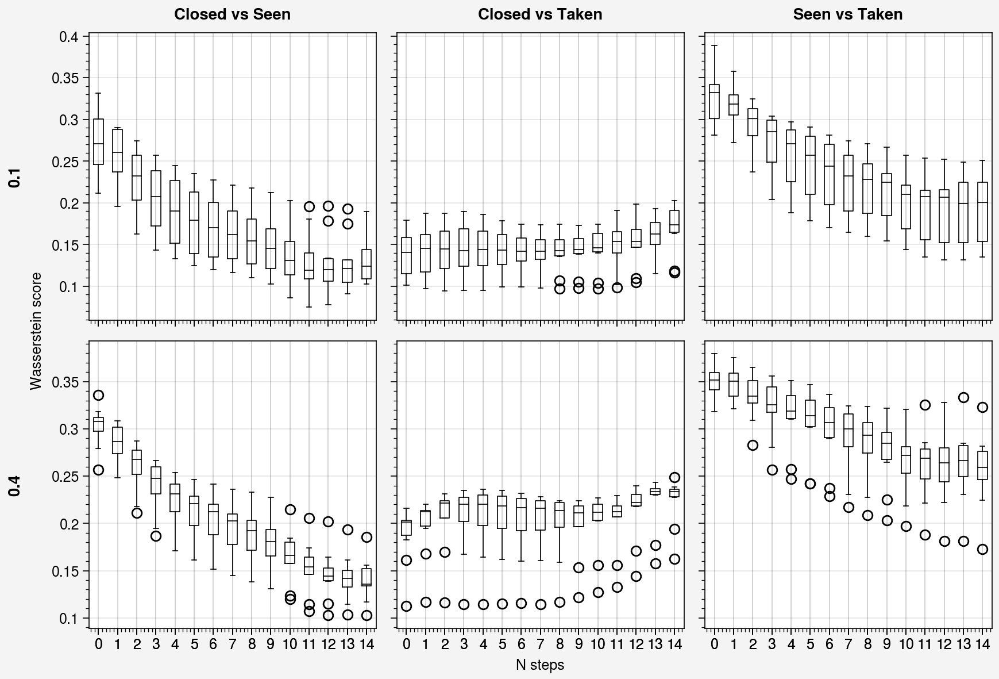

In [49]:
# activs = pickle.load(open('data/shortcut/wc1.5_copiedv2_moreagents/shared1_activ', 'rb'))

ns = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 14, 16, 18, 20]
trials = range(10)
probs = [0.1, 0.4]
chk = 10
all_scores = defaultdict(list)
for p in probs:
    n_scores1 = []
    n_scores2 = []
    n_scores3 = []
    
    for t in trials:
        key = f'{p}_{t}'
        
        scores1 = []
        scores2 = []
        scores3 = []
        for n in ns:
            
            res = activs[key][chk]
            
            activ = np.vstack([a for i, a in enumerate(res['activ']) if i not in keep_eps])
            vis = [v for i, v in enumerate(res['vis']) if i not in keep_eps]
            shortcut_avail = [a for i, a in enumerate(res['shortcut_avail']) if i not in keep_eps]
            shortcut_used = [u for i, u in enumerate(res['shortcut_used']) if i not in keep_eps]
            
            color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n+3, n)
            score1 = two_cloud_wasserstein(activ[color==0], activ[color==1], all_data=activ)[0]
            score2 = two_cloud_wasserstein(activ[color==0], activ[color==2], all_data=activ)[0]
            score3 = two_cloud_wasserstein(activ[color==1], activ[color==2], all_data=activ)[0]
            scores1.append(score1)
            scores2.append(score2)
            scores3.append(score3)
            
        n_scores1.append(scores1)
        n_scores2.append(scores2)
        n_scores3.append(scores3)
        
    all_scores['none_vs_vis'].append(n_scores1)
    all_scores['none_vs_taken'].append(n_scores3)
    all_scores['vis_vs_taken'].append(n_scores2)
    
fig, ax = pplt.subplots(nrows=2, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['Closed vs Seen', 'Closed vs Taken', 'Seen vs Taken']
for i, p in enumerate(probs):
    for j, key in enumerate(keys):
        ax[i, j].boxplot(np.array(all_scores[key][i]))
        
ax.format(xlabel='N steps', ylabel='Wasserstein score',
         leftlabels=[f'{p}' for p in probs],
         toplabels=leftlabels)


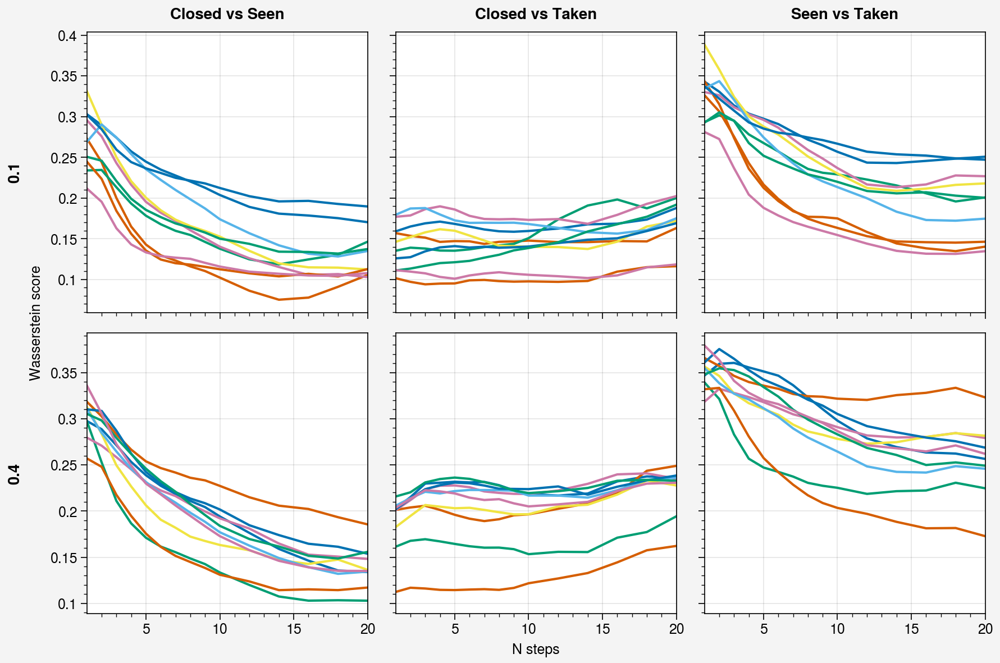

In [50]:
fig, ax = pplt.subplots(nrows=2, ncols=3)

keys = ['none_vs_vis', 'none_vs_taken', 'vis_vs_taken']
leftlabels = ['Closed vs Seen', 'Closed vs Taken', 'Seen vs Taken']
for i, p in enumerate(probs):
    for j, key in enumerate(keys):
        for t in trials:
            ax[i, j].plot(ns, np.array(all_scores[key][i][t]))
        
ax.format(xlabel='N steps', ylabel='Wasserstein score',
         leftlabels=[f'{p}' for p in probs],
         toplabels=leftlabels)


In [45]:
res = activs['0.4_0'][chk]

activ = np.vstack([a for i, a in enumerate(res['activ']) if i in keep_eps])
vis = [v for i, v in enumerate(res['vis']) if i in keep_eps]
shortcut_avail = [a for i, a in enumerate(res['shortcut_avail']) if i in keep_eps]
shortcut_used = [u for i, u in enumerate(res['shortcut_used']) if i in keep_eps]

color = vision_decision_coloring(vis, shortcut_avail, shortcut_used, n+3, n)


In [48]:
two_cloud_wasserstein(activ[color == 0], activ[color == 1], all_data=activ)[0]

0.035367420294203304

In [46]:
collections.Counter(color)

Counter({-1: 255, 0: 9, 1: 8})